In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_percentage_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
import random
from tensorflow.keras.optimizers import Adam

# Import Data

In [2]:
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)
random.seed(seed)

In [3]:
data = pd.read_csv('https://raw.githubusercontent.com/Mluthfialgifari/Tugas-Akhir-Skripsi/refs/heads/main/Revisi%20Analisis/Data%20TMA%20(Jan%202022%20-%20Juni%202025).csv')
data = data.loc[:, ['Daily_Period','TMA_Daily']]
data = data.iloc[:1215].reset_index(drop=True)

print(data.head())
print(data.tail())
print(data.shape)

  Daily_Period  TMA_Daily
0   01/01/2022       10.0
1   02/01/2022       10.0
2   03/01/2022       10.0
3   04/01/2022       10.0
4   05/01/2022       12.5
     Daily_Period  TMA_Daily
1210   25/04/2025  20.000000
1211   26/04/2025  20.000000
1212   27/04/2025  20.000000
1213   28/04/2025  21.666667
1214   29/04/2025  20.000000
(1215, 2)


# Eksplorasi Data

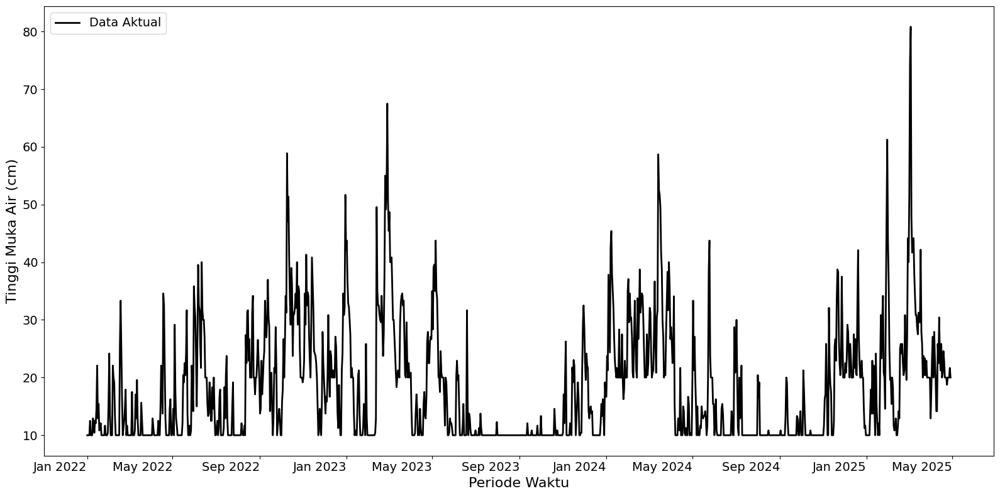

Dimension of full data: (1215, 2)


In [4]:
import matplotlib.pyplot as plt
from matplotlib.dates import MonthLocator, DateFormatter
import pandas as pd

# Pastikan kolom waktu dalam format datetime
data['Daily_Period'] = pd.to_datetime(data['Daily_Period'], format='%d/%m/%Y')

# Membuat plot seluruh data tanpa split
plt.figure(figsize=(16, 8))
plt.plot(data['Daily_Period'], data['TMA_Daily'], lw=2, color='black', label='Data Aktual')

# Label dan format
plt.xlabel('Periode Waktu', fontsize=16)
plt.ylabel('Tinggi Muka Air (cm)', fontsize=16)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Set axis locator dan format tanggal
plt.gca().xaxis.set_major_locator(MonthLocator(bymonth=[1, 5, 9]))
plt.gca().xaxis.set_major_formatter(DateFormatter('%b %Y'))

# Format rotasi tanggal
plt.gcf().autofmt_xdate(rotation=0)

# Tambahkan legend
plt.legend(fontsize=14)
# plt.title('Plot Seluruh Data Time Series TMA', fontsize=18)

plt.tight_layout()
plt.show()

# Print dimensi total
print('Dimension of full data:', data.shape)

# Normalisasi Data

Proses normalisasi data dilakukan menggunakan metode min-max normalization hingga menghasilkan data yang berskala [0,1].

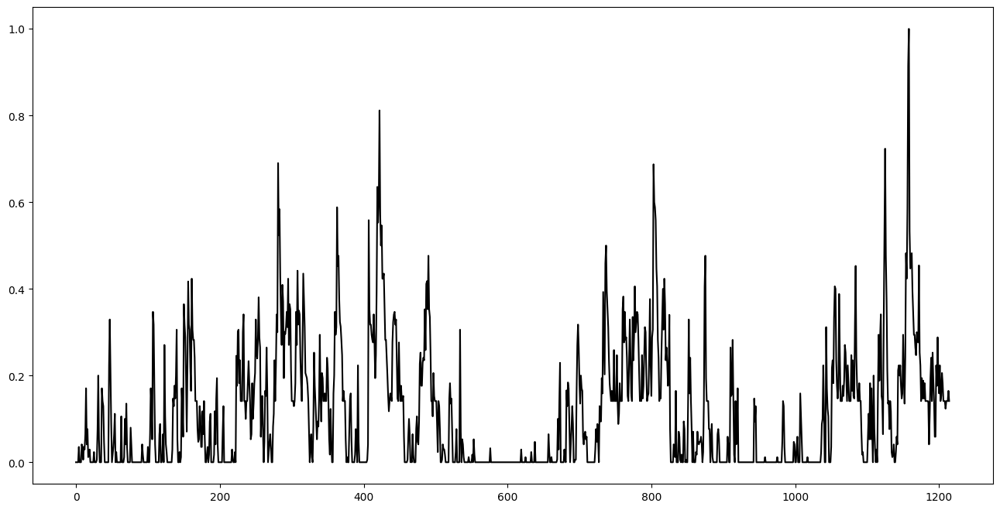

In [5]:
# Step 1: Normalize the data using Min-Max scaling
scaler = MinMaxScaler()
data['TMA_normalized'] = scaler.fit_transform(data['TMA_Daily'].values.reshape(-1, 1))
plt.figure(figsize=(16, 8))
plt.plot(data['TMA_normalized'], color='black')

In [6]:
print(data['TMA_normalized'].head())
print(data['TMA_normalized'].tail())

0    0.000000
1    0.000000
2    0.000000
3    0.000000
4    0.035294
Name: TMA_normalized, dtype: float64
1210    0.141176
1211    0.141176
1212    0.141176
1213    0.164706
1214    0.141176
Name: TMA_normalized, dtype: float64


# Hyperparameter Tuning & Cross Validation

Hyperparameter tuning dilakukan untuk menentukan hyperparameter terbaik melalui langkah validasi berupa *time series k-fold cross validation*. Banyaknya fold yang digunakan dalam langkah validasi adalah sebanyak k = 5 fold.

In [7]:
data_series = data['TMA_normalized'].values
data_series = data_series.reshape((len(data_series), 1))
data_series

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.14117647],
       [0.16470588],
       [0.14117647]])

In [8]:
from tensorflow.keras.initializers import HeUniform, GlorotUniform

def create_model(neurons, learning_rate, init_scheme='he_uniform'):
    seed = 42
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

    # Pilih initializer berdasarkan parameter
    if init_scheme == 'he_uniform':
        initializer = HeUniform()
    elif init_scheme == 'glorot_uniform':
        initializer = GlorotUniform()
    else:
        raise ValueError("init_scheme harus 'he_uniform' atau 'glorot_uniform'")

    model = Sequential()
    model.add(LSTM(
        neurons,
        activation='tanh',
        input_shape=(30, 1),
        return_sequences=True,
        kernel_initializer=initializer,
        recurrent_initializer=initializer,
        bias_initializer='zeros'
    ))
    model.add(LSTM(
        16,
        activation='tanh',
        kernel_initializer=initializer,
        recurrent_initializer=initializer,
        bias_initializer='zeros'
    ))
    model.add(Dropout(0.2))
    model.add(Dense(1, kernel_initializer=initializer, bias_initializer='zeros'))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

In [9]:
import keras

class EarlyStoppingAtMinLoss(keras.callbacks.Callback):
    """Stop training when the loss is at its min, i.e. the loss stops decreasing.

    Arguments:
        patience: Number of epochs to wait after min has been hit. After this
        number of no improvement, training stops.
    """

    def __init__(self, patience=0):
        super().__init__()
        self.patience = patience
        # best_weights to store the weights at which the minimum loss occurs.
        self.best_weights = None

    def on_train_begin(self, logs=None):
        # The number of epoch it has waited when loss is no longer minimum.
        self.wait = 0
        # The epoch the training stops at.
        self.stopped_epoch = 0
        # Initialize the best as infinity.
        self.best = np.inf

    def on_epoch_end(self, epoch, logs=None):
        current = logs.get("val_loss")
        if np.less(current, self.best):
            self.best = current
            self.wait = 0
            # print('abcd')
            # Record the best weights if current results is better (less).
            self.best_weights = self.model.get_weights()
        else:
            self.wait += 1
            if self.wait >= self.patience:
                self.stopped_epoch = epoch
                self.model.stop_training = True
                print("Restoring model weights from the end of the best epoch.")
                self.model.set_weights(self.best_weights)

    def on_train_end(self, logs=None):
        if self.stopped_epoch > 0:
            print("Epoch %05d: early stopping" % (self.stopped_epoch + 1))

## Sliding Window Cross Validation

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 189ms/step - loss: 0.1732 - val_loss: 0.1220
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0460 - val_loss: 0.1296
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0765 - val_loss: 0.0478
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0313 - val_loss: 0.0536
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0361 - val_loss: 0.0550
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0550 - val_loss: 0.0429
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0189 - val_loss: 0.0244
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0157 - val_loss: 0.0141
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0115 - val_loss: 0.0171
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0118 - val_loss: 0.0265
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0137 - val_loss: 0.0221
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0106 - val_l

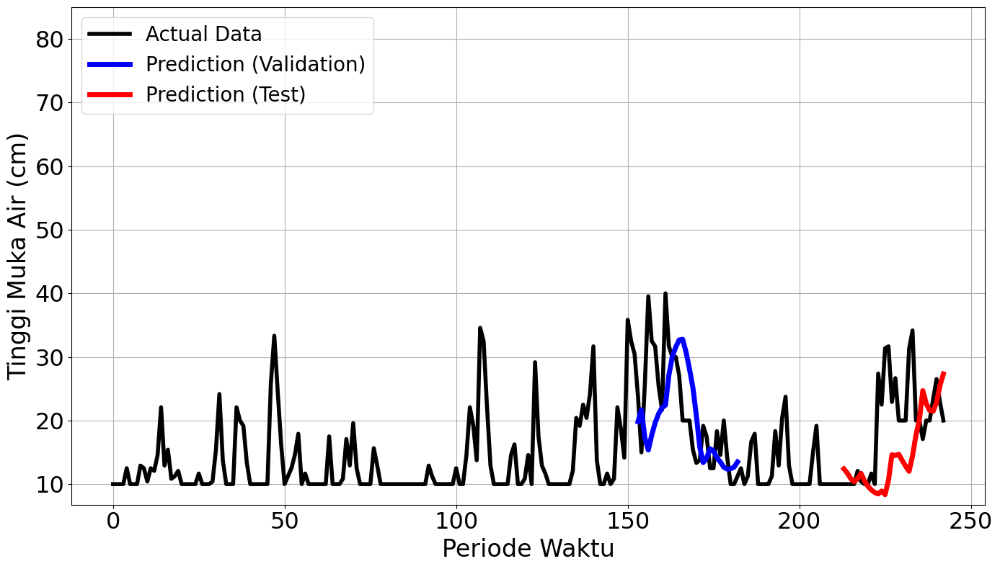

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.1392 - val_loss: 0.1295
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1088 - val_loss: 0.1442
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0973 - val_loss: 0.1384
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0362 - val_loss: 0.0607
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0443 - val_loss: 0.0333
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0386 - val_loss: 0.0247
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0308 - val_loss: 0.0262
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0260 - val_loss: 0.0289
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0361 - val_loss: 0.0304
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0279 - val_loss: 0.0319
Epoch 11/150
4/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0275Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0

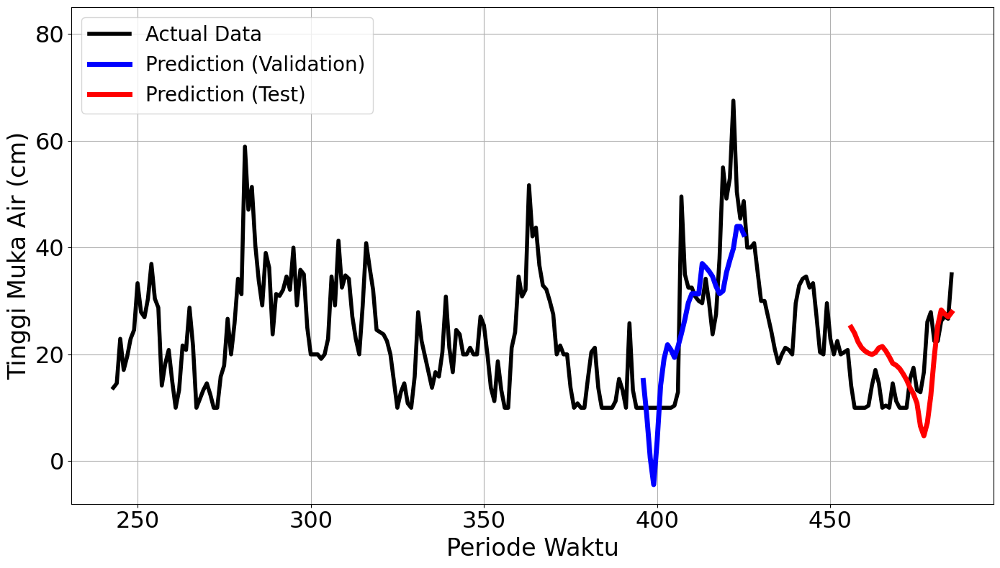

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 176ms/step - loss: 0.1055 - val_loss: 0.0012
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0615 - val_loss: 9.0491e-04
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0510 - val_loss: 4.9852e-04
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0320 - val_loss: 3.4067e-04
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0150 - val_loss: 2.2784e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0201 - val_loss: 2.5445e-04
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0131 - val_loss: 1.8667e-04
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0157 - val_loss: 2.0813e-04
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0085 - val_loss: 1.9467e-04
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0082 - val_loss: 3.3400e-04
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0090 - val_loss: 3.4942e-04
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms

1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 299ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
mape validation = 3.632891884167322 %
mape test = 24.58465917750877 %


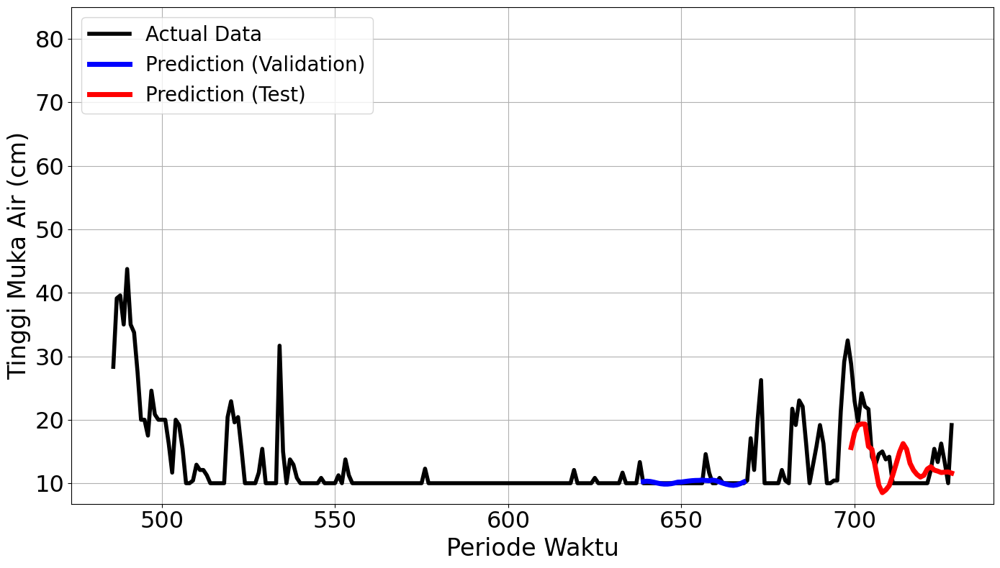

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1864 - val_loss: 0.0722
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0792 - val_loss: 0.0303
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0762 - val_loss: 0.0208
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0622 - val_loss: 0.0150
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0667 - val_loss: 0.0121
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0539 - val_loss: 0.0193
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0310 - val_loss: 0.0273
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0352 - val_loss: 0.0260
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0325 - val_loss: 0.0106
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0445 - val_loss: 0.0138
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0315 - val_loss: 0.0373
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0301 - val_loss: 0.0212


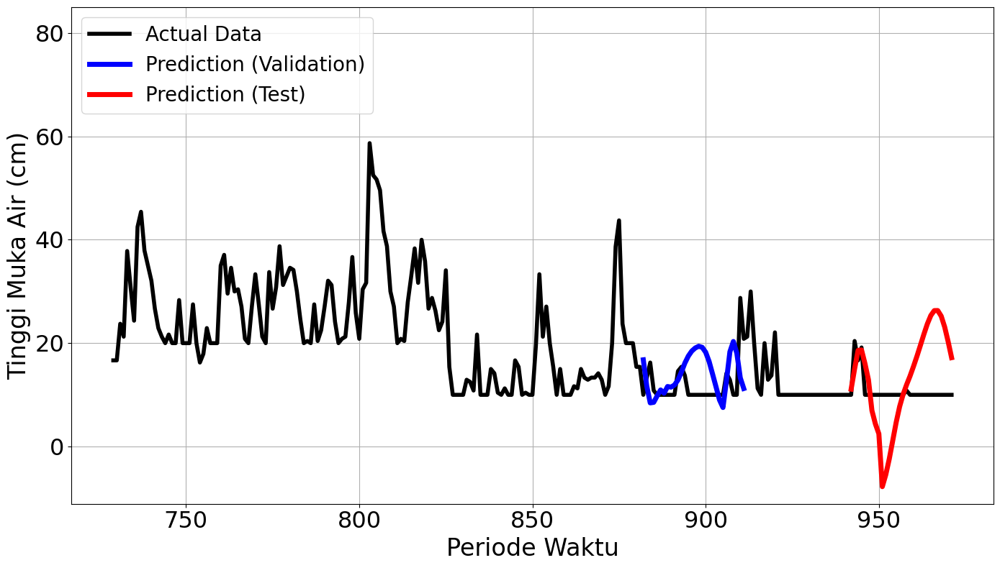

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1251 - val_loss: 0.0753
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0868 - val_loss: 0.0575
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0424 - val_loss: 0.0345
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0548 - val_loss: 0.0285
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0405 - val_loss: 0.0310
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0541 - val_loss: 0.0311
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0350 - val_loss: 0.0259
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0246 - val_loss: 0.0266
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0230 - val_loss: 0.0256
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0315 - val_loss: 0.0255
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0127 - val_loss: 0.0261
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0208 - val_loss: 0.0244


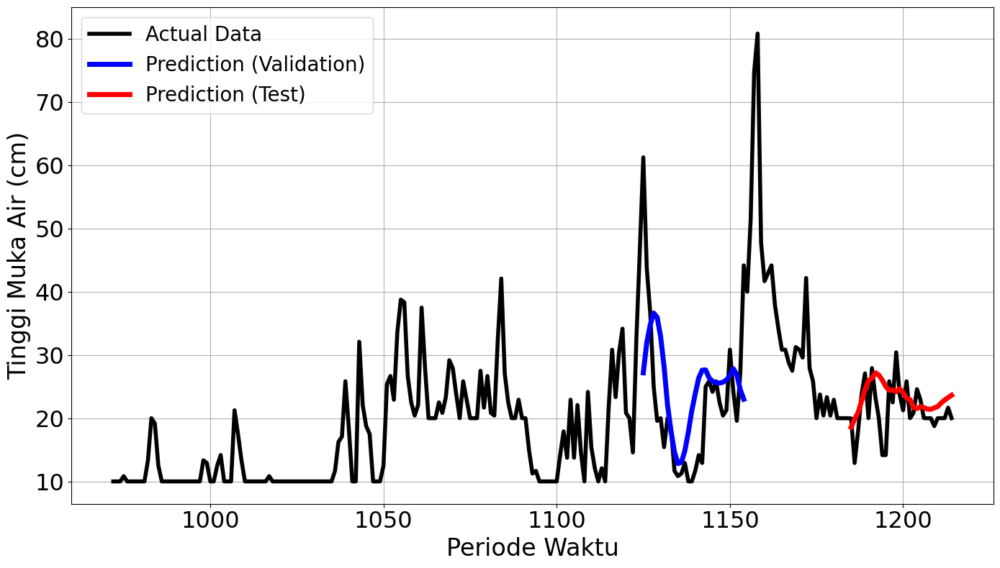

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3116
Final Average MAPE Test: 0.4132
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1732 - val_loss: 0.1220
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0460 - val_loss: 0.1296
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0765 - val_loss: 0.0478
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0313 - val_loss: 0.0536
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0361 - val_loss: 0.0550
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0550 - val_loss: 0.0429
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0189 - val_loss: 0.0244
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0157 - val_loss: 0.0141
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0115 - val_loss: 0.0171
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0118 - val_loss: 0.0265
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0137 - val_loss: 0.0221
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0106 - val_loss: 0.0235


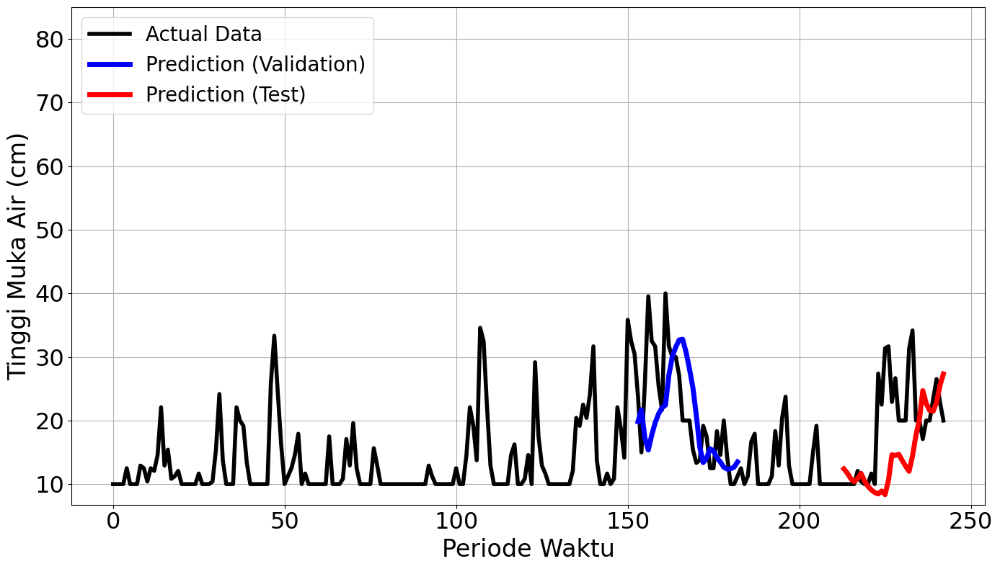

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1392 - val_loss: 0.1295
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1088 - val_loss: 0.1442
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0973 - val_loss: 0.1384
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0362 - val_loss: 0.0607
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0443 - val_loss: 0.0333
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0386 - val_loss: 0.0247
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0308 - val_loss: 0.0262
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0260 - val_loss: 0.0289
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0361 - val_loss: 0.0304
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0279 - val_loss: 0.0319
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0267Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0

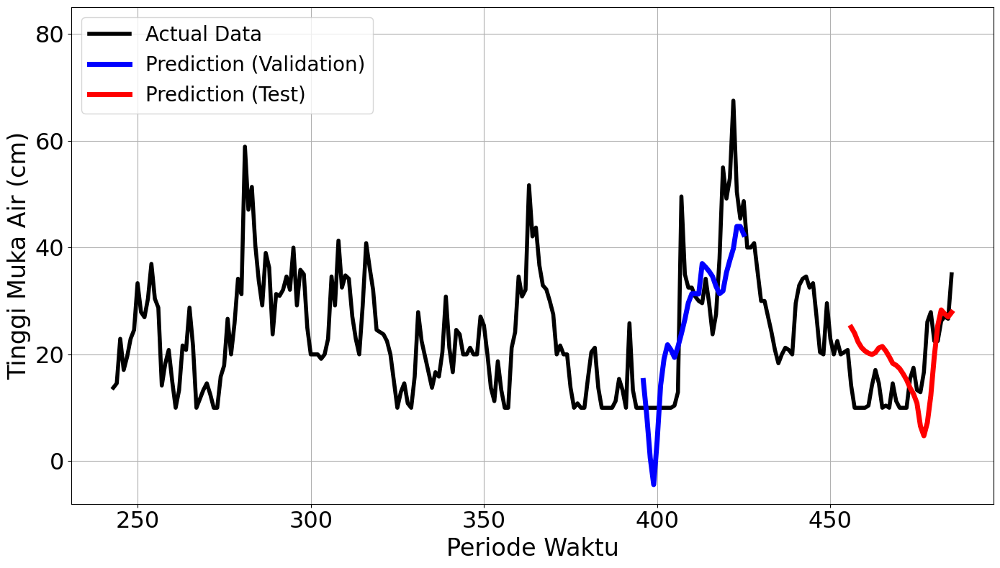

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 179ms/step - loss: 0.1055 - val_loss: 0.0012
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0615 - val_loss: 9.0491e-04
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0510 - val_loss: 4.9852e-04
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0320 - val_loss: 3.4067e-04
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0150 - val_loss: 2.2784e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0201 - val_loss: 2.5445e-04
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0131 - val_loss: 1.8667e-04
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0157 - val_loss: 2.0813e-04
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0085 - val_loss: 1.9467e-04
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0082 - val_loss: 3.3400e-04
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0090 - val_loss: 3.4942e-04
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms

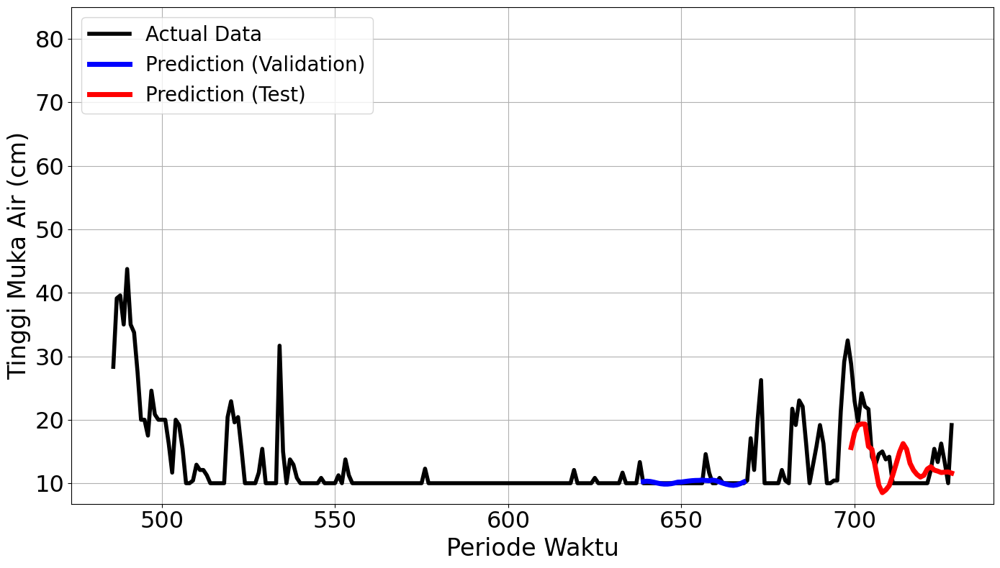

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1864 - val_loss: 0.0722
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0792 - val_loss: 0.0303
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0762 - val_loss: 0.0208
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0622 - val_loss: 0.0150
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0667 - val_loss: 0.0121
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0539 - val_loss: 0.0193
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.0310 - val_loss: 0.0273
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0352 - val_loss: 0.0260
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0325 - val_loss: 0.0106
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0445 - val_loss: 0.0138
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0315 - val_loss: 0.0373
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0301 - val_loss: 0.0212

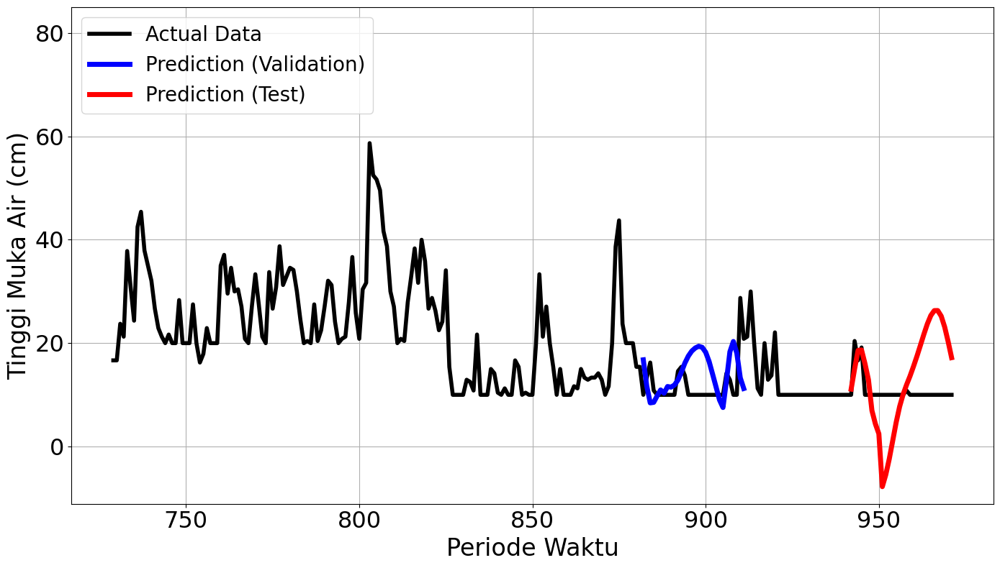

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.1251 - val_loss: 0.0753
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0868 - val_loss: 0.0575
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0424 - val_loss: 0.0345
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0548 - val_loss: 0.0285
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0405 - val_loss: 0.0310
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0541 - val_loss: 0.0311
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0350 - val_loss: 0.0259
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0246 - val_loss: 0.0266
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0230 - val_loss: 0.0256
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.0315 - val_loss: 0.0255
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.0127 - val_loss: 0.0261
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0208 - val

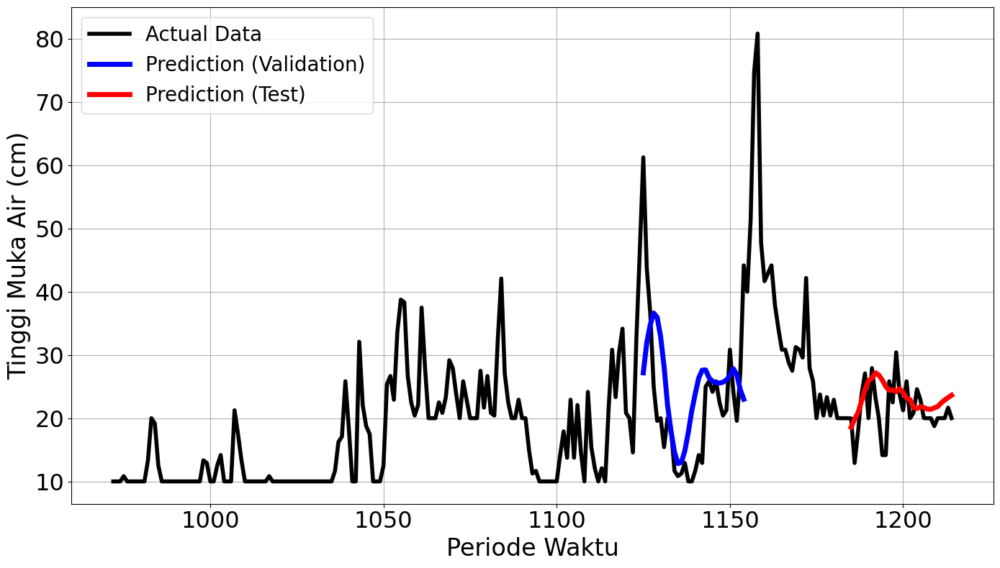

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3116
Final Average MAPE Test: 0.4132
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 293ms/step - loss: 0.1607 - val_loss: 0.1246
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0764 - val_loss: 0.1737
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0428 - val_loss: 0.1461
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0443 - val_loss: 0.1003
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0329 - val_loss: 0.0767
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0295 - val_loss: 0.0784
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0316 - val_loss: 0.0803
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0303 - val_loss: 0.0627
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0282 - val_loss: 0.0455
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0208 - val_loss: 0.0326
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0294 - val_loss: 0.0299
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0276 - val_loss: 0.0316


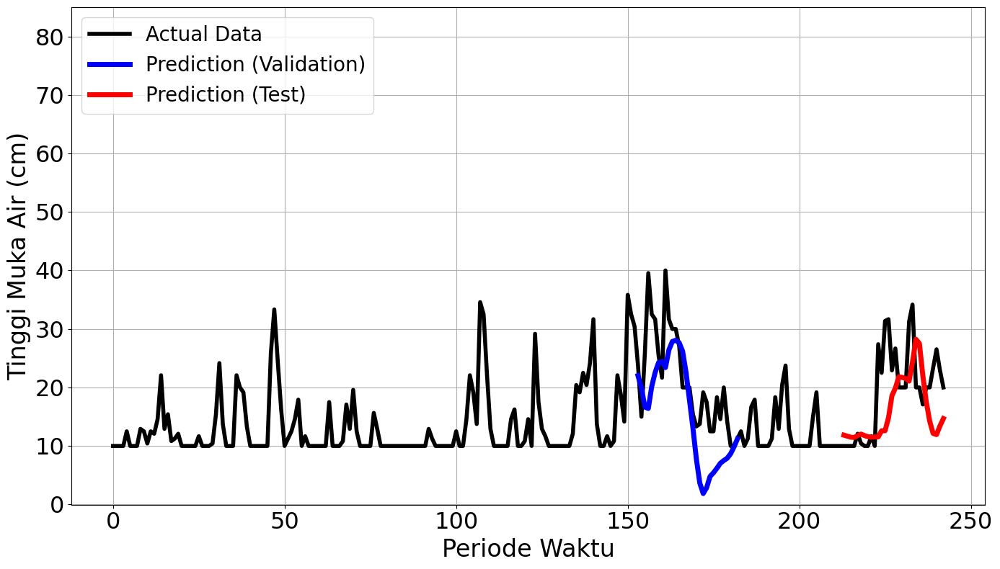

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 267ms/step - loss: 0.1280 - val_loss: 0.1709
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0896 - val_loss: 0.1699
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0880 - val_loss: 0.1601
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0539 - val_loss: 0.1505
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0428 - val_loss: 0.1364
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0390 - val_loss: 0.1204
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0331 - val_loss: 0.1108
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0366 - val_loss: 0.0764
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0418 - val_loss: 0.0749
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0413 - val_loss: 0.0780
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0374 - val_loss: 0.0595
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0295 - val_loss: 0.0527


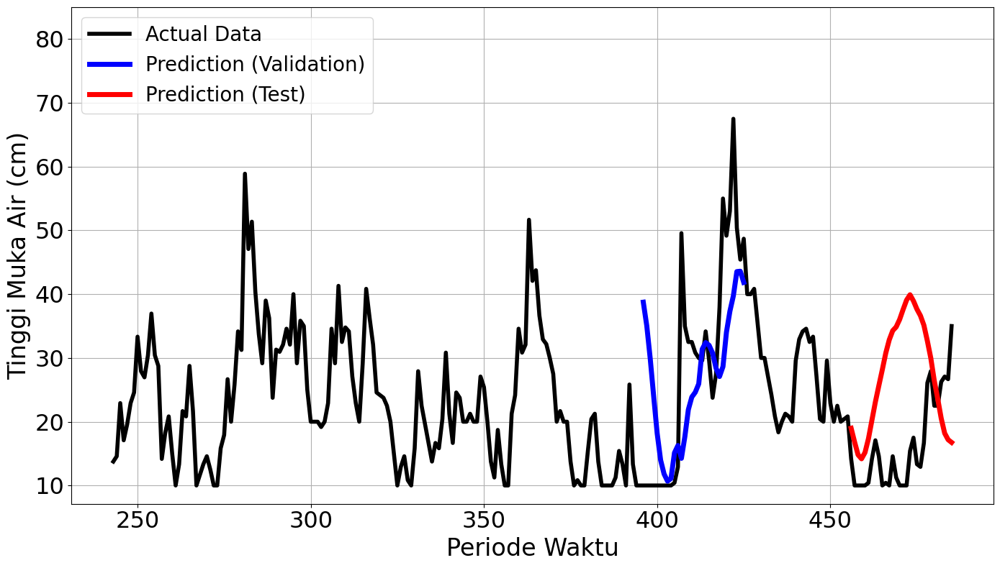

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 273ms/step - loss: 0.1495 - val_loss: 0.0397
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0731 - val_loss: 0.0164
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0545 - val_loss: 0.0016
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0503 - val_loss: 0.0018
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0366 - val_loss: 0.0033
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0243 - val_loss: 0.0018
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0212 - val_loss: 0.0057
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0185Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0190 - val_loss: 0.0047
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
mape validation = 25.187625467471836 %
mape test = 104.52200804192502 %


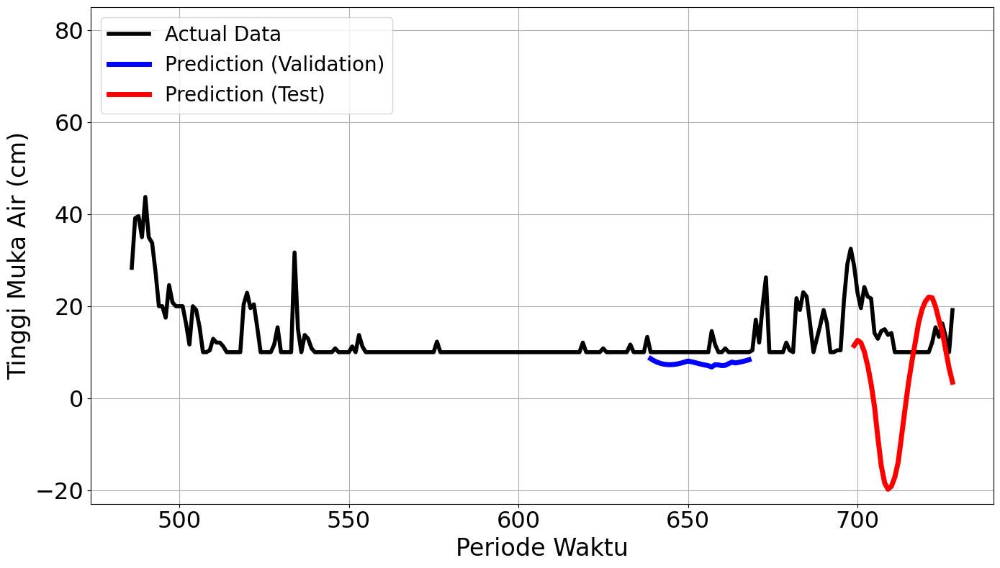

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 281ms/step - loss: 0.1894 - val_loss: 0.0825
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0831 - val_loss: 0.0186
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0599 - val_loss: 0.0074
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0609 - val_loss: 0.0161
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0416 - val_loss: 0.0167
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0326 - val_loss: 0.0164
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0446 - val_loss: 0.0141
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0468Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0452 - val_loss: 0.0126
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
mape validation = 44.19165861464775 %
mape test = 154.52274743844347 %


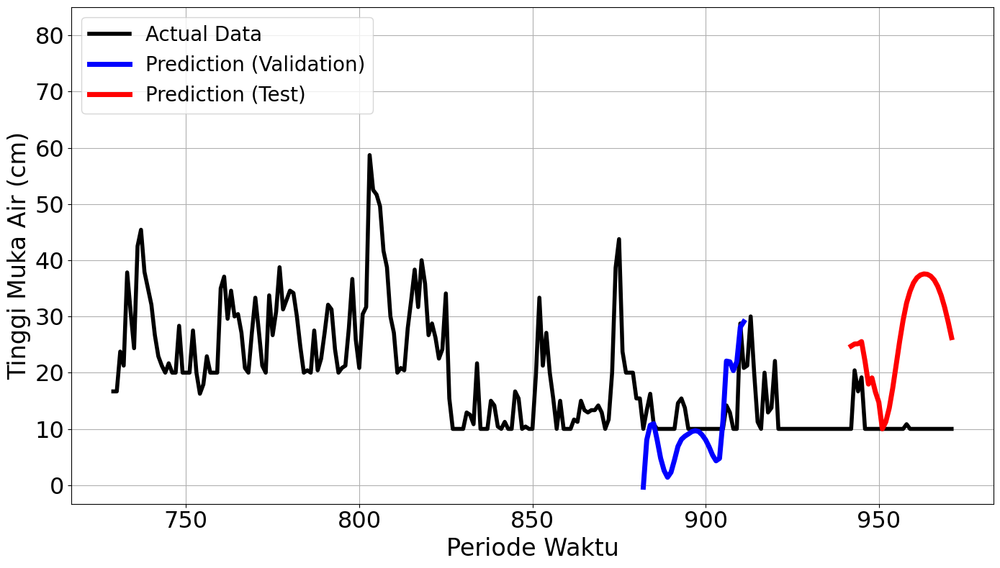

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 269ms/step - loss: 0.2023 - val_loss: 0.0373
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0935 - val_loss: 0.0360
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0673 - val_loss: 0.0350
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0876 - val_loss: 0.0308
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0719 - val_loss: 0.0279
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0635 - val_loss: 0.0282
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0677 - val_loss: 0.0271
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0738 - val_loss: 0.0237
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0536 - val_loss: 0.0215
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0300 - val_loss: 0.0214
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0478 - val_loss: 0.0211
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0440 - val_loss: 0.0211


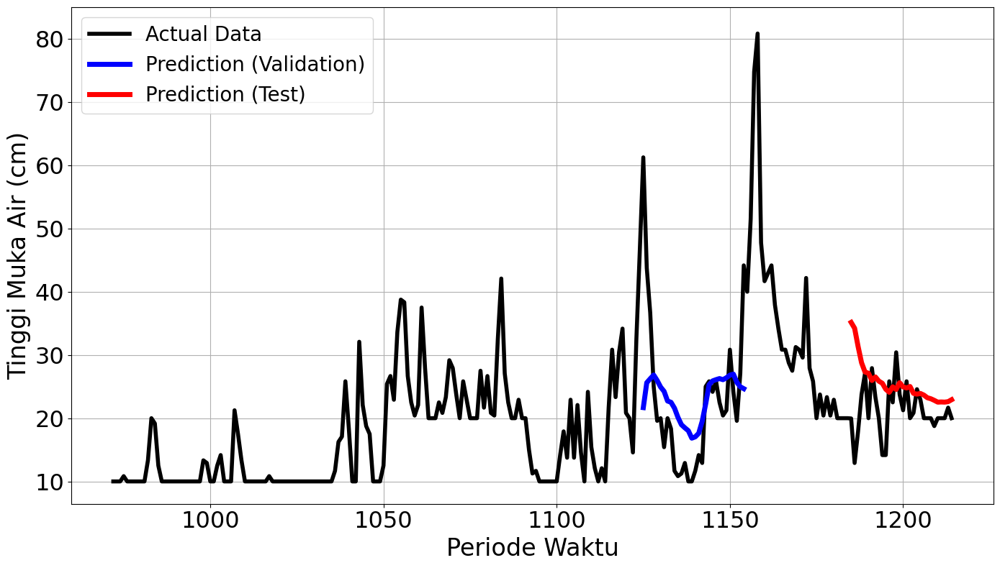

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3808
Final Average MAPE Test: 0.8391
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 434ms/step - loss: 0.1607 - val_loss: 0.1246
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0764 - val_loss: 0.1737
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0428 - val_loss: 0.1461
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0443 - val_loss: 0.1003
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0329 - val_loss: 0.0767
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0295 - val_loss: 0.0784
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0316 - val_loss: 0.0803
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0303 - val_loss: 0.0627
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0282 - val_loss: 0.0455
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0208 - val_loss: 0.0326
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0294 - val_loss: 0.0299
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0276 - val_loss: 0.0316


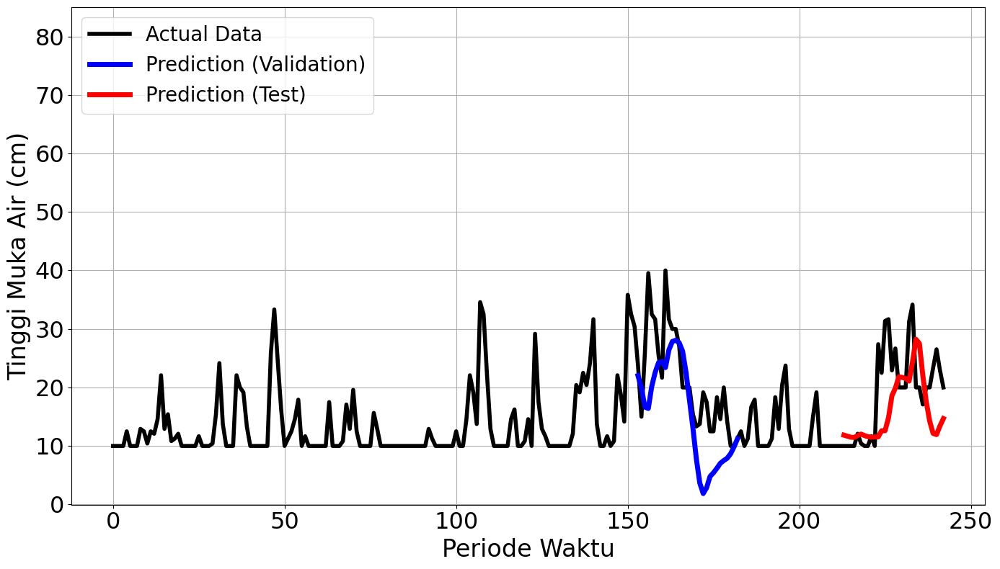

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 299ms/step - loss: 0.1280 - val_loss: 0.1709
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0896 - val_loss: 0.1699
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0880 - val_loss: 0.1601
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0539 - val_loss: 0.1505
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0428 - val_loss: 0.1364
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0390 - val_loss: 0.1204
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0331 - val_loss: 0.1108
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0366 - val_loss: 0.0764
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0418 - val_loss: 0.0749
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0413 - val_loss: 0.0780
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0374 - val_loss: 0.0595
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0295 - val_loss: 0.0527

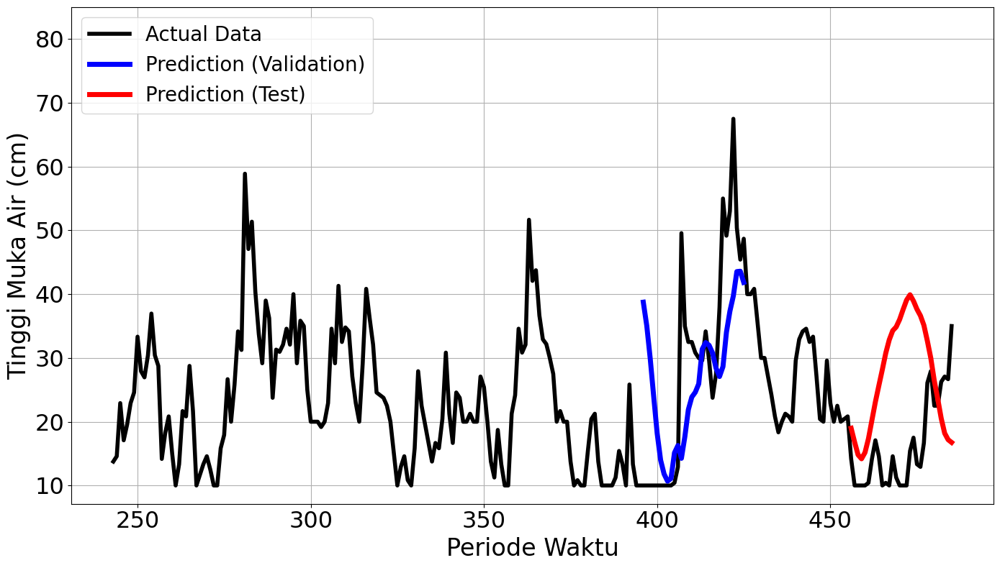

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 274ms/step - loss: 0.1495 - val_loss: 0.0397
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0731 - val_loss: 0.0164
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0545 - val_loss: 0.0016
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0503 - val_loss: 0.0018
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0366 - val_loss: 0.0033
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0243 - val_loss: 0.0018
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0212 - val_loss: 0.0057
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0185Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0190 - val_loss: 0.0047
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
mape validation = 25.187625467471836 %
mape test = 104.52200804192502 %


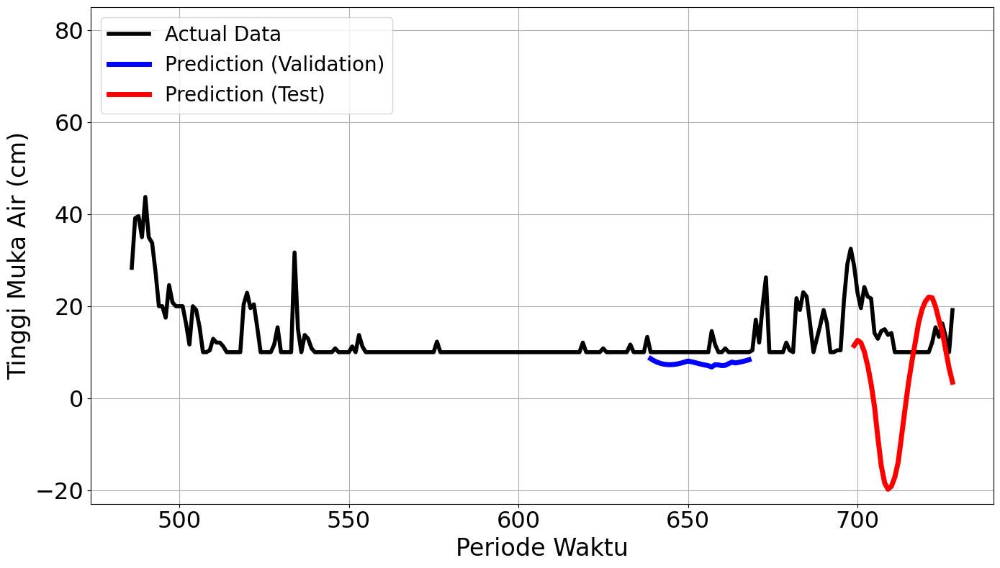

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 301ms/step - loss: 0.1894 - val_loss: 0.0825
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0831 - val_loss: 0.0186
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0599 - val_loss: 0.0074
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0609 - val_loss: 0.0161
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0416 - val_loss: 0.0167
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0326 - val_loss: 0.0164
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0446 - val_loss: 0.0141
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0468Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0452 - val_loss: 0.0126
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
mape validation = 44.19165861464775 %
mape test = 154.52274743844347 %


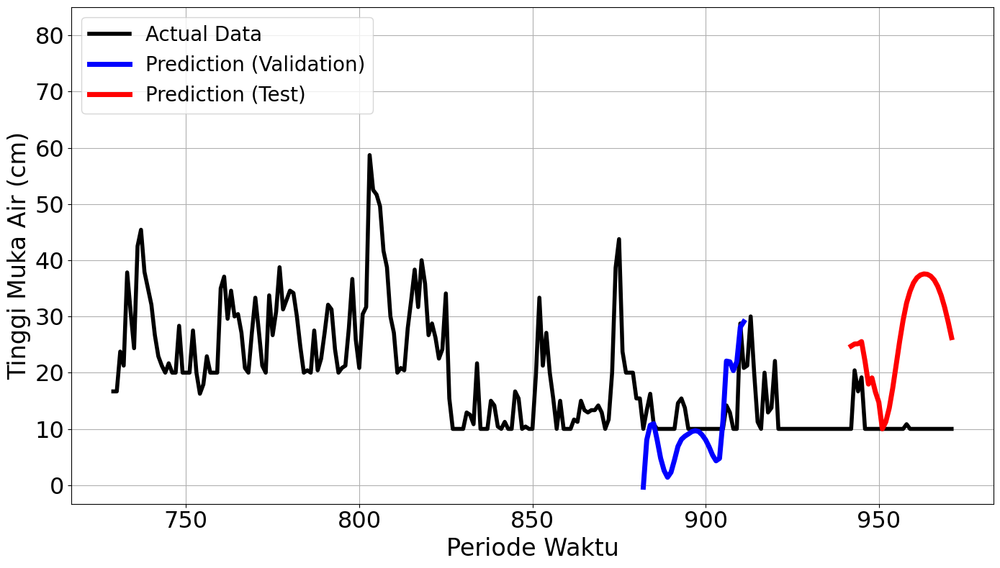

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 269ms/step - loss: 0.2023 - val_loss: 0.0373
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0935 - val_loss: 0.0360
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0673 - val_loss: 0.0350
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0876 - val_loss: 0.0308
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0719 - val_loss: 0.0279
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0635 - val_loss: 0.0282
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0677 - val_loss: 0.0271
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0738 - val_loss: 0.0237
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 105ms/step - loss: 0.0536 - val_loss: 0.0215
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0300 - val_loss: 0.0214
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0478 - val_loss: 0.0211
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0440 - val_loss: 0.02

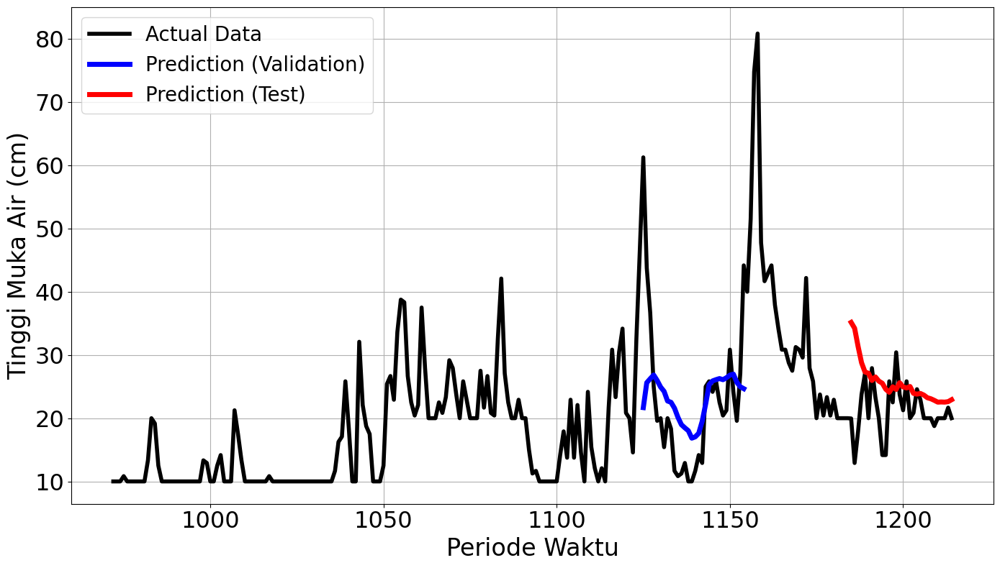

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3808
Final Average MAPE Test: 0.8391
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 527ms/step - loss: 0.2976 - val_loss: 0.0938
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0760 - val_loss: 0.1355
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0699 - val_loss: 0.1301
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0494 - val_loss: 0.1198
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0671 - val_loss: 0.0945
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0449 - val_loss: 0.0731
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0208 - val_loss: 0.0585
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0429 - val_loss: 0.0601
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0306 - val_loss: 0.0658
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0296 - val_loss: 0.0735
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0361 - val_loss: 0.0797
Epoch 12/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - loss: 0.0319Restoring model w

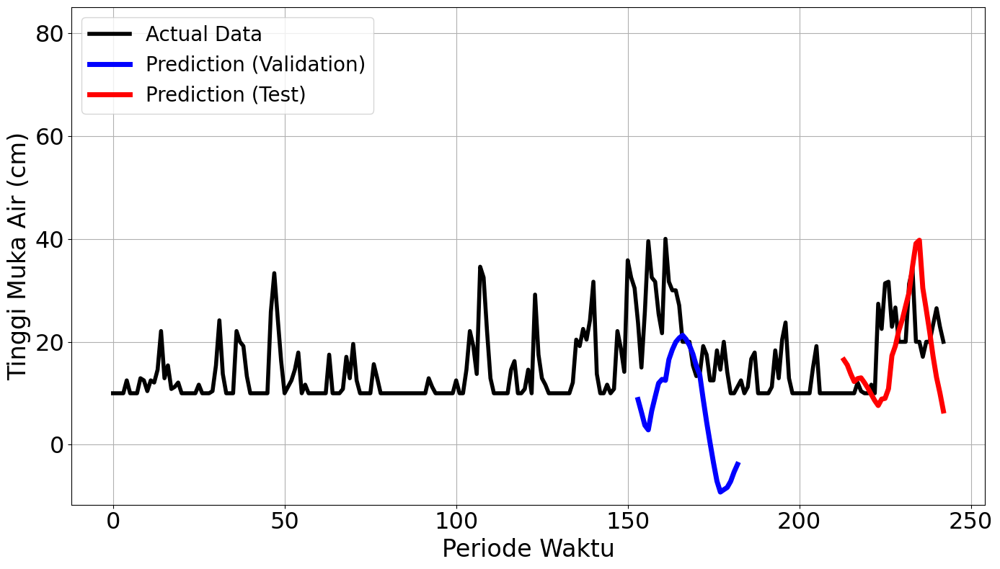

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 497ms/step - loss: 0.1185 - val_loss: 0.1838
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.1359 - val_loss: 0.1453
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1322 - val_loss: 0.1301
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.1073 - val_loss: 0.1286
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.1358 - val_loss: 0.1346
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0928 - val_loss: 0.1251
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0839 - val_loss: 0.1228
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1238 - val_loss: 0.1292
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.1014 - val_loss: 0.1312
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0722 - val_loss: 0.1310
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0818 - val_loss: 0.1318
Epoch 12/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0888Restoring model we

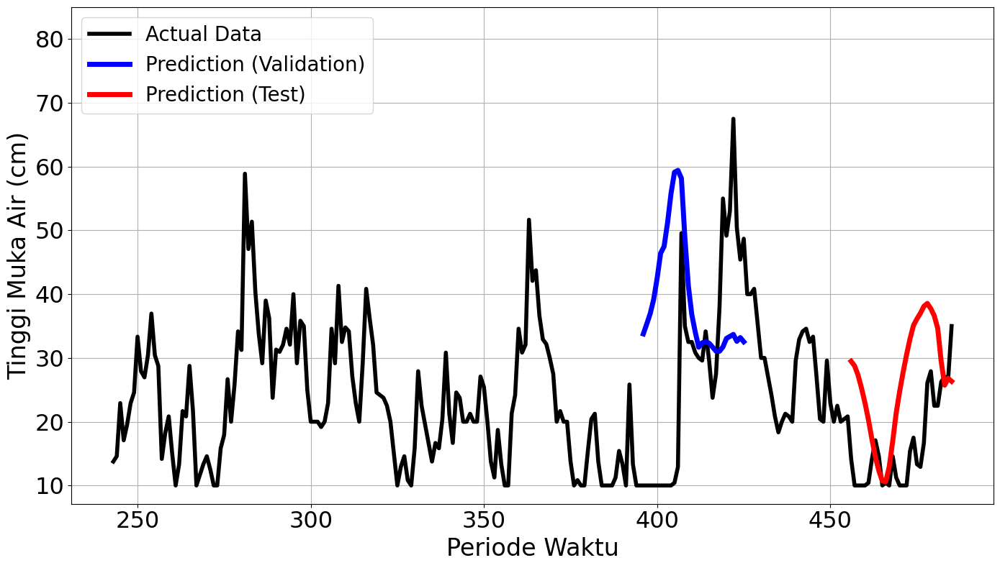

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 507ms/step - loss: 0.2739 - val_loss: 8.2739e-04
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0443 - val_loss: 0.0103
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0481 - val_loss: 0.0067
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0350 - val_loss: 0.0018
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0435 - val_loss: 7.4006e-04
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0310 - val_loss: 0.0027
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0358 - val_loss: 0.0045
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0278 - val_loss: 0.0031
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0131 - val_loss: 0.0020
Epoch 10/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0044Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0119 - val_loss: 0.0013
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━

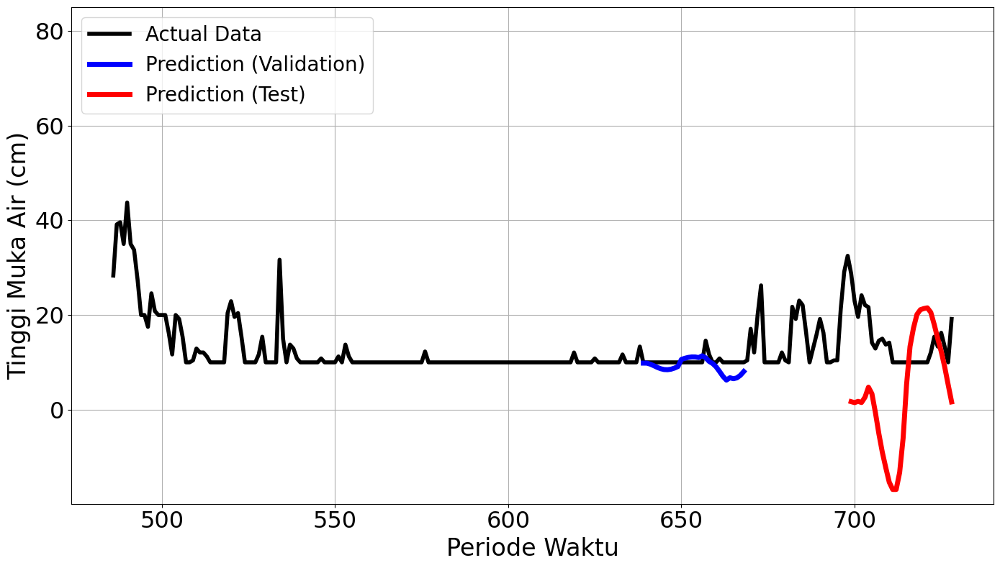

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 510ms/step - loss: 0.1829 - val_loss: 0.2582
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.1544 - val_loss: 0.1169
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1190 - val_loss: 0.0300
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0864 - val_loss: 0.0117
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0826 - val_loss: 0.0263
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0809 - val_loss: 0.0357
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0578 - val_loss: 0.0314
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0550 - val_loss: 0.0230
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0554Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.0522 - val_loss: 0.0166
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
mape validation = 45.90948772982328 %


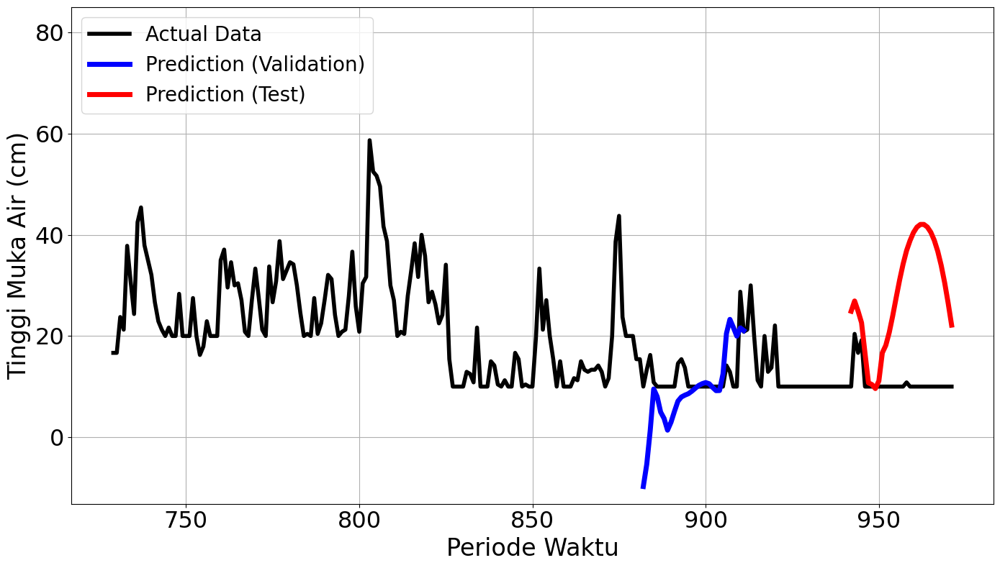

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 495ms/step - loss: 0.2002 - val_loss: 0.0217
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0754 - val_loss: 0.0326
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0943 - val_loss: 0.0407
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0904 - val_loss: 0.0385
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0597 - val_loss: 0.0320
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0722 Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step - loss: 0.0711 - val_loss: 0.0283
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
mape validation = 36.07540181579695 %
mape test = 18.3064422202003 %


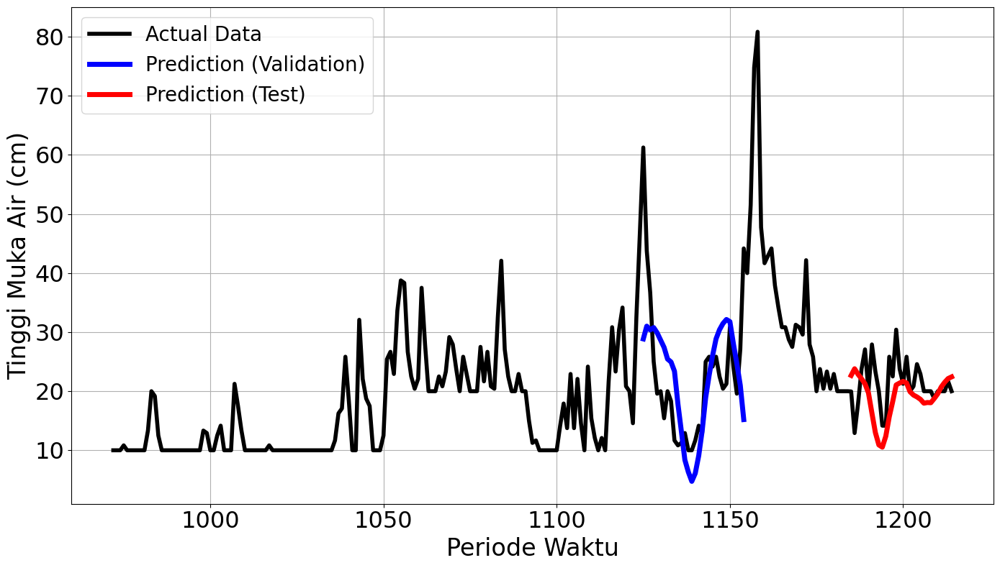

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.6273
Final Average MAPE Test: 0.8359
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 528ms/step - loss: 0.2976 - val_loss: 0.0938
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0760 - val_loss: 0.1355
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0699 - val_loss: 0.1301
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0494 - val_loss: 0.1198
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0671 - val_loss: 0.0945
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0449 - val_loss: 0.0731
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0208 - val_loss: 0.0585
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0429 - val_loss: 0.0601
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0306 - val_loss: 0.0658
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0296 - val_loss: 0.0735
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0361 - val_loss: 0.0797
Epoch 12/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0319Restoring m

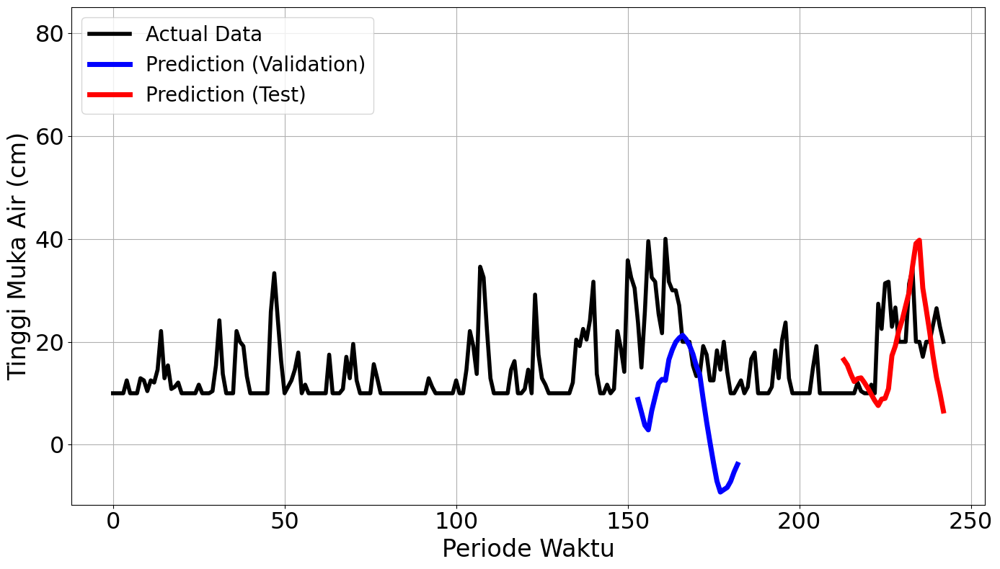

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 800ms/step - loss: 0.1185 - val_loss: 0.1838
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - loss: 0.1359 - val_loss: 0.1453
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - loss: 0.1322 - val_loss: 0.1301
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - loss: 0.1073 - val_loss: 0.1286
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.1358 - val_loss: 0.1346
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0928 - val_loss: 0.1251
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0839 - val_loss: 0.1228
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1238 - val_loss: 0.1292
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.1014 - val_loss: 0.1312
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0722 - val_loss: 0.1310
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0818 - val_loss: 0.1318
Epoch 12/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0888Restoring mod

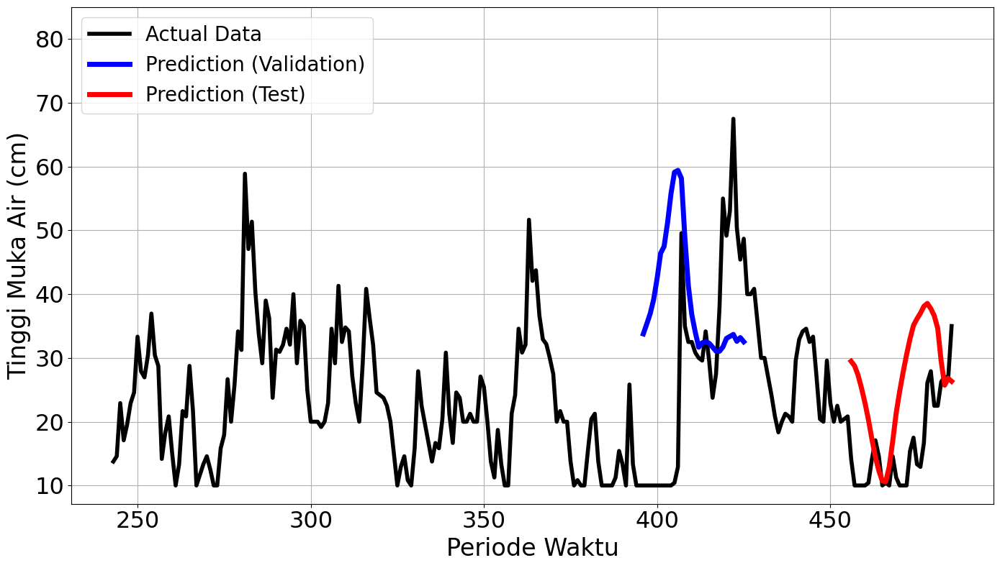

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 507ms/step - loss: 0.2739 - val_loss: 8.2739e-04
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0443 - val_loss: 0.0103
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0481 - val_loss: 0.0067
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0350 - val_loss: 0.0018
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0435 - val_loss: 7.4006e-04
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0310 - val_loss: 0.0027
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0358 - val_loss: 0.0045
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0278 - val_loss: 0.0031
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0131 - val_loss: 0.0020
Epoch 10/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0044Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0119 - val_loss: 0.0013
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━

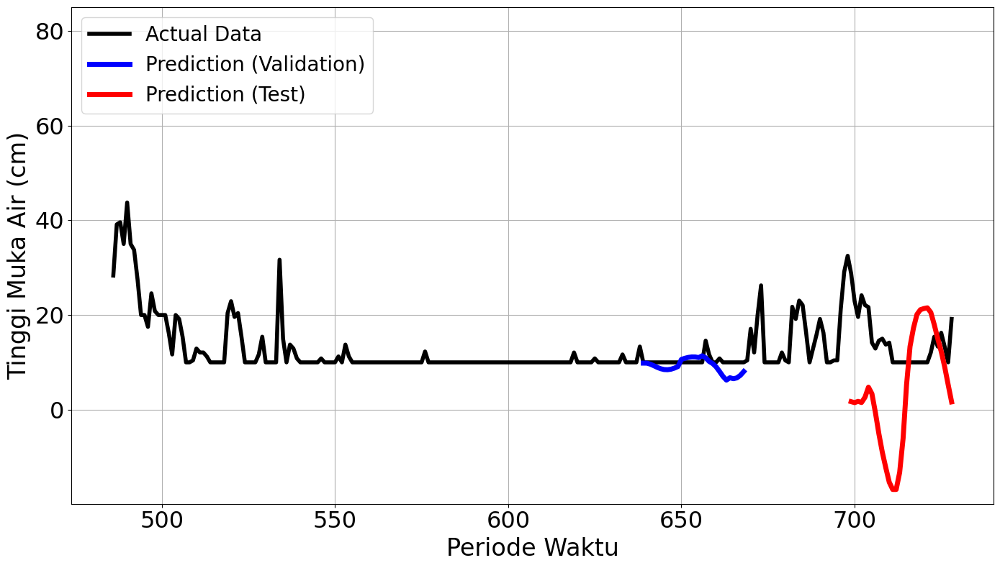

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 505ms/step - loss: 0.1829 - val_loss: 0.2582
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1544 - val_loss: 0.1169
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1190 - val_loss: 0.0300
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0864 - val_loss: 0.0117
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0826 - val_loss: 0.0263
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0809 - val_loss: 0.0357
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0578 - val_loss: 0.0314
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0550 - val_loss: 0.0230
Epoch 9/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0649Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0522 - val_loss: 0.0166
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
mape validation = 45.90948772982328 

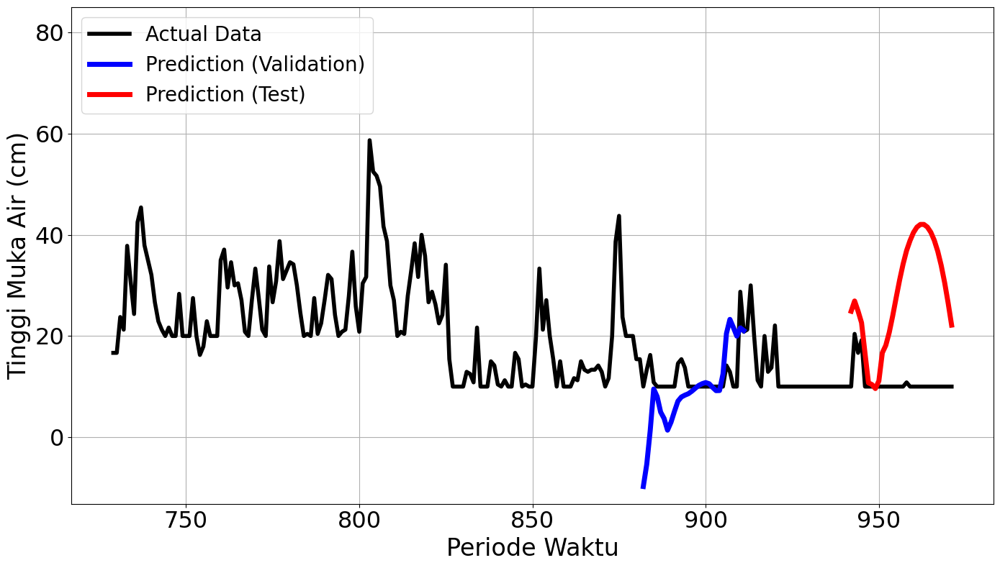

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 573ms/step - loss: 0.2002 - val_loss: 0.0217
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.0754 - val_loss: 0.0326
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0943 - val_loss: 0.0407
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0904 - val_loss: 0.0385
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0597 - val_loss: 0.0320
Epoch 6/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - loss: 0.0755Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0711 - val_loss: 0.0283
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
mape validation = 36.07540181579695 %
mape test = 18.3064422202003 %


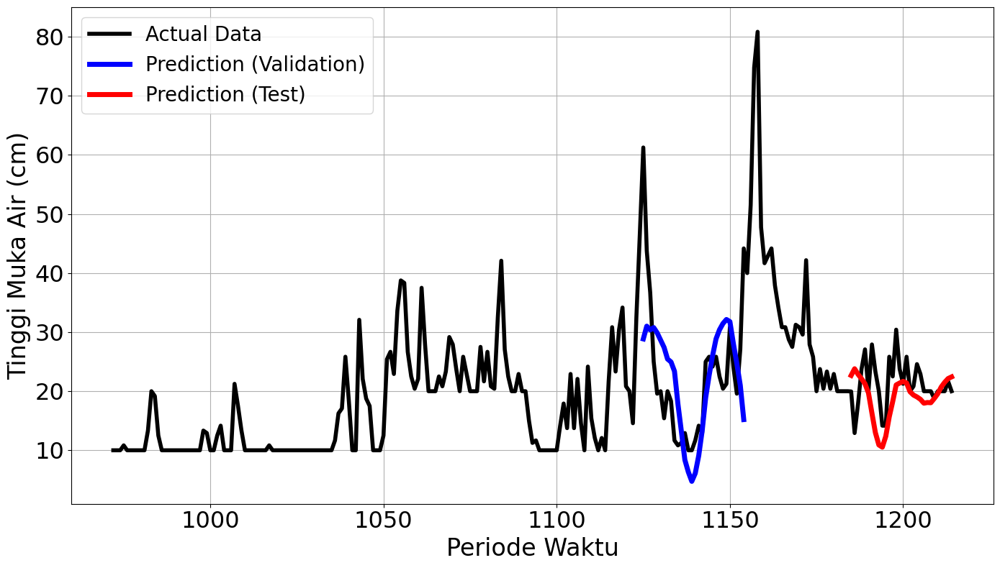

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.6273
Final Average MAPE Test: 0.8359
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.2733 - val_loss: 0.0570
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 0.1883 - val_loss: 0.0839
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - loss: 0.0940 - val_loss: 0.1080
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0570 - val_loss: 0.1251
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0542 - val_loss: 0.1308
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - loss: 0.0702Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step - loss: 0.0702 - val_loss: 0.1325
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
mape validation = 72.26660362597978 %
mape test = 139.8455401830503 %


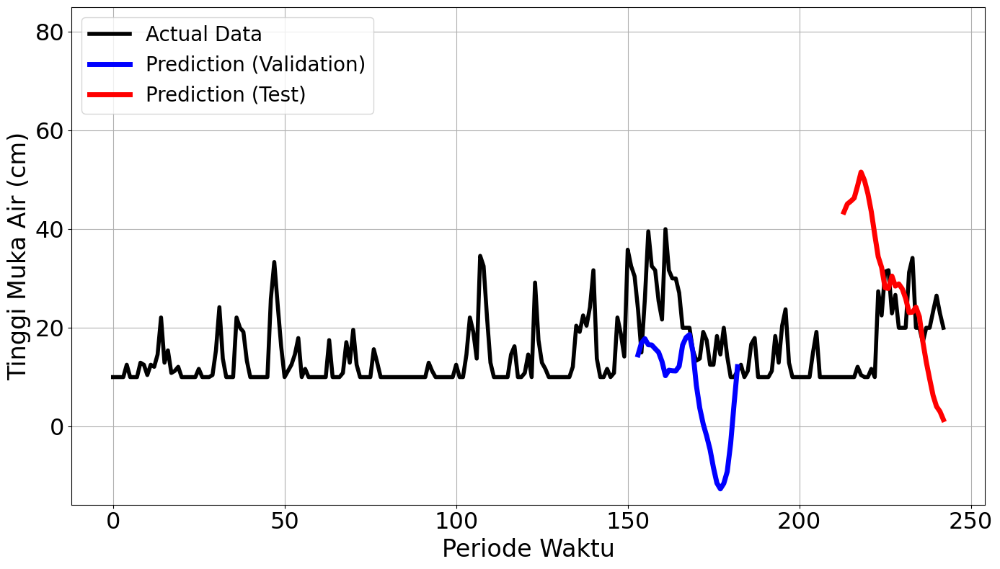

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.1435 - val_loss: 0.1885
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.1229 - val_loss: 0.1854
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - loss: 0.1030 - val_loss: 0.1793
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step - loss: 0.1238 - val_loss: 0.1714
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0945 - val_loss: 0.1644
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.1044 - val_loss: 0.1618
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0742 - val_loss: 0.1621
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step - loss: 0.0682 - val_loss: 0.1577
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - loss: 0.0450 - val_loss: 0.1481
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0497 - val_loss: 0.1370
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0485 - val_loss: 0.1263
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.0498 - val_loss:

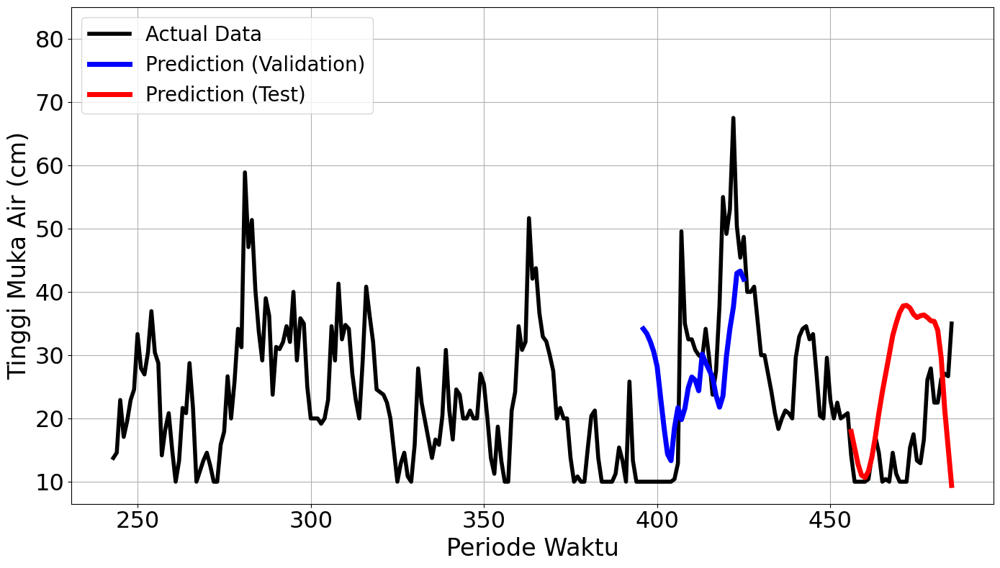

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.2400 - val_loss: 0.0055
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 954ms/step - loss: 0.1523 - val_loss: 0.0044
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step - loss: 0.0689 - val_loss: 9.4478e-04
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - loss: 0.0576 - val_loss: 7.4441e-04
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.0484 - val_loss: 0.0013
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.0680 - val_loss: 0.0013
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step - loss: 0.0667 - val_loss: 6.9698e-04
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - loss: 0.0479 - val_loss: 3.6553e-04
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0416 - val_loss: 5.1631e-04
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0418 - val_loss: 0.0014
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0316 - val_loss: 0.0024
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - loss

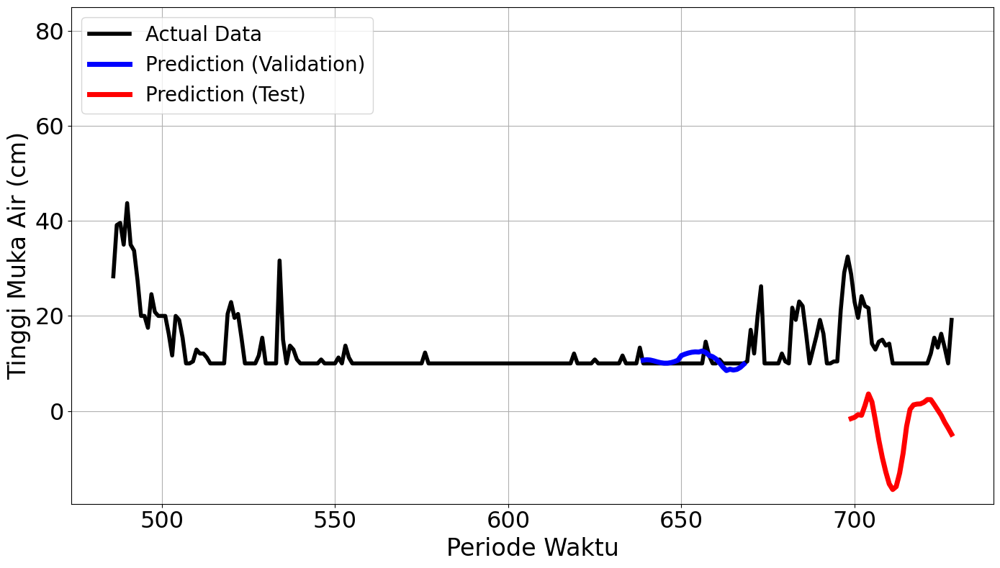

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.1862 - val_loss: 0.2637
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.1229 - val_loss: 0.2182
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.1210 - val_loss: 0.1586
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step - loss: 0.1134 - val_loss: 0.0959
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - loss: 0.0924 - val_loss: 0.0447
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - loss: 0.1058 - val_loss: 0.0153
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - loss: 0.0540 - val_loss: 0.0082
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - loss: 0.0790 - val_loss: 0.0128
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - loss: 0.0666 - val_loss: 0.0206
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - loss: 0.0669 - val_loss: 0.0277
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - loss: 0.0676 - val_loss: 0.0317
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0528Restoring mod

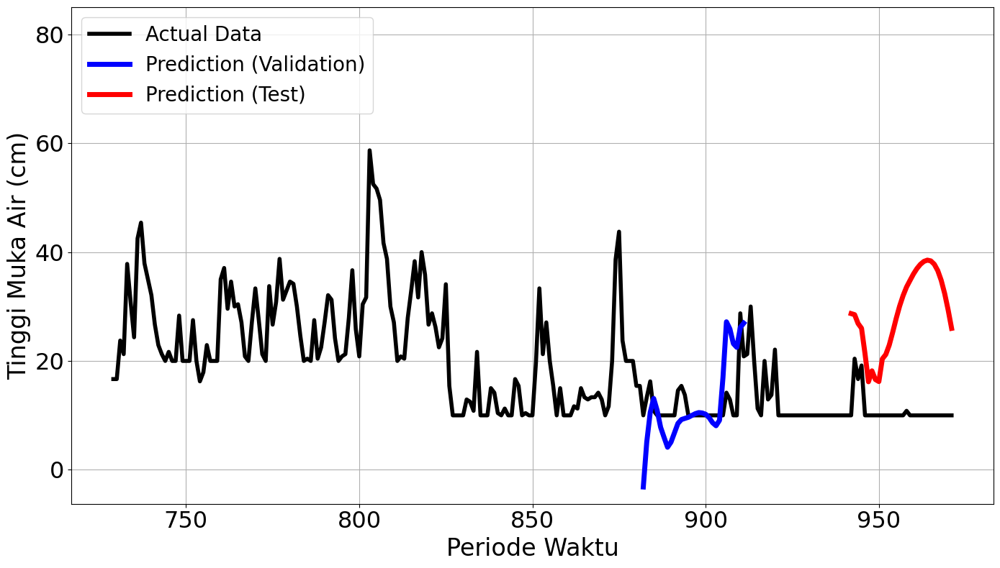

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.2292 - val_loss: 0.0191
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - loss: 0.1169 - val_loss: 0.0215
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step - loss: 0.0978 - val_loss: 0.0227
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step - loss: 0.0911 - val_loss: 0.0218
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - loss: 0.0453 - val_loss: 0.0210
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0773Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0773 - val_loss: 0.0226
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
mape validation = 34.82622382760053 %
mape test = 19.179454670594648 %


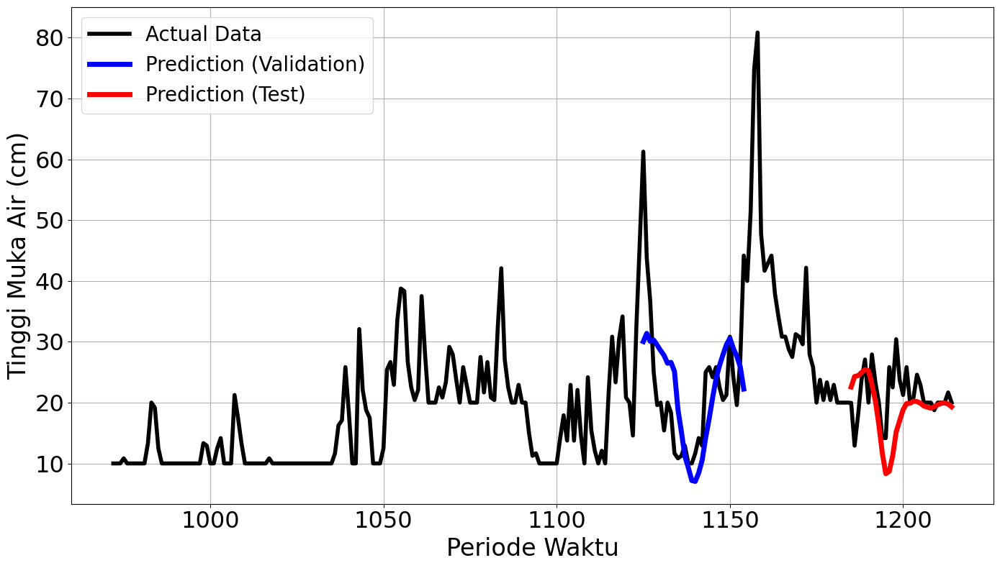

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.4486
Final Average MAPE Test: 1.1204
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.2733 - val_loss: 0.0570
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.1883 - val_loss: 0.0839
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step - loss: 0.0940 - val_loss: 0.1080
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step - loss: 0.0570 - val_loss: 0.1251
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - loss: 0.0542 - val_loss: 0.1308
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - loss: 0.0702Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step - loss: 0.0702 - val_loss: 0.1325
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
mape validation = 72.26660362597978 %
mape test = 139.8455401830503 %


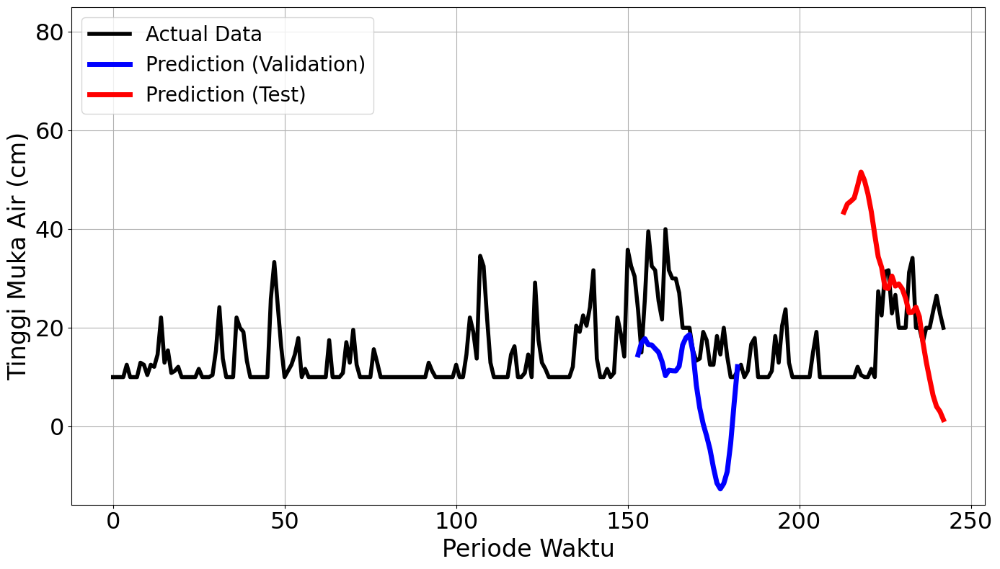

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.1435 - val_loss: 0.1885
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - loss: 0.1229 - val_loss: 0.1854
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - loss: 0.1030 - val_loss: 0.1793
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - loss: 0.1238 - val_loss: 0.1714
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step - loss: 0.0945 - val_loss: 0.1644
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step - loss: 0.1044 - val_loss: 0.1618
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step - loss: 0.0742 - val_loss: 0.1621
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step - loss: 0.0682 - val_loss: 0.1577
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0450 - val_loss: 0.1481
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - loss: 0.0497 - val_loss: 0.1370
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step - loss: 0.0485 - val_loss: 0.1263
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step - loss: 0.0498 - val_loss:

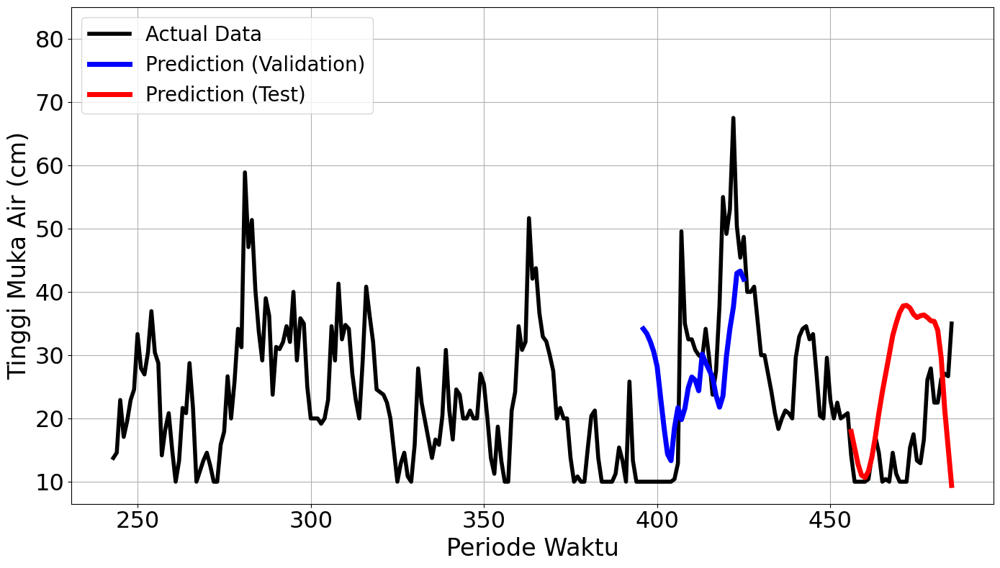

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.2400 - val_loss: 0.0055
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.1523 - val_loss: 0.0044
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0689 - val_loss: 9.4478e-04
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step - loss: 0.0576 - val_loss: 7.4441e-04
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0484 - val_loss: 0.0013
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step - loss: 0.0680 - val_loss: 0.0013
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0667 - val_loss: 6.9698e-04
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0479 - val_loss: 3.6553e-04
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - loss: 0.0416 - val_loss: 5.1631e-04
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - loss: 0.0418 - val_loss: 0.0014
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - loss: 0.0316 - val_loss: 0.0024
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss

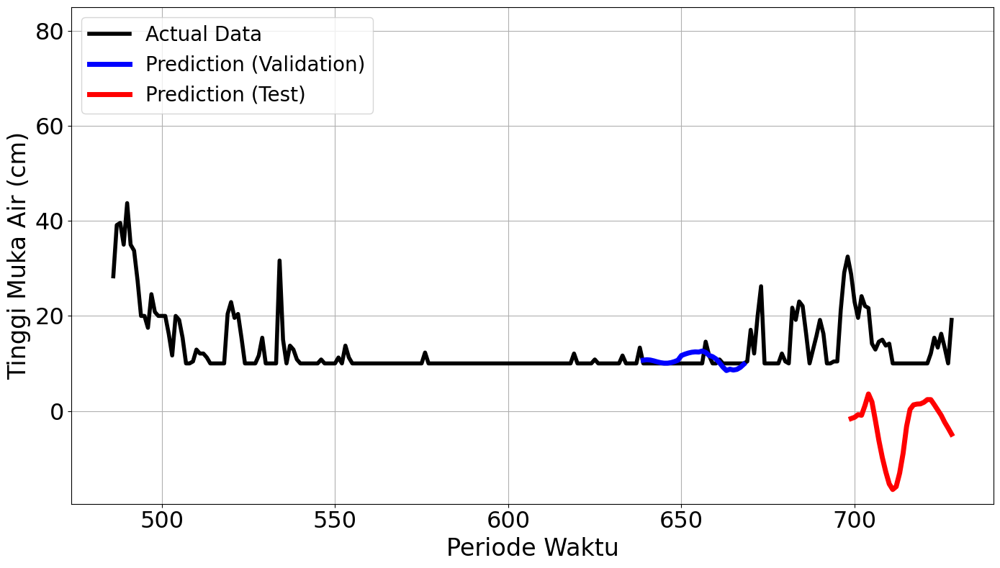

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.1862 - val_loss: 0.2637
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - loss: 0.1229 - val_loss: 0.2182
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - loss: 0.1210 - val_loss: 0.1586
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.1134 - val_loss: 0.0959
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step - loss: 0.0924 - val_loss: 0.0447
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 0.1058 - val_loss: 0.0153
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step - loss: 0.0540 - val_loss: 0.0082
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0790 - val_loss: 0.0128
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - loss: 0.0666 - val_loss: 0.0206
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 0.0669 - val_loss: 0.0277
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - loss: 0.0676 - val_loss: 0.0317
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.0528Restoring mo

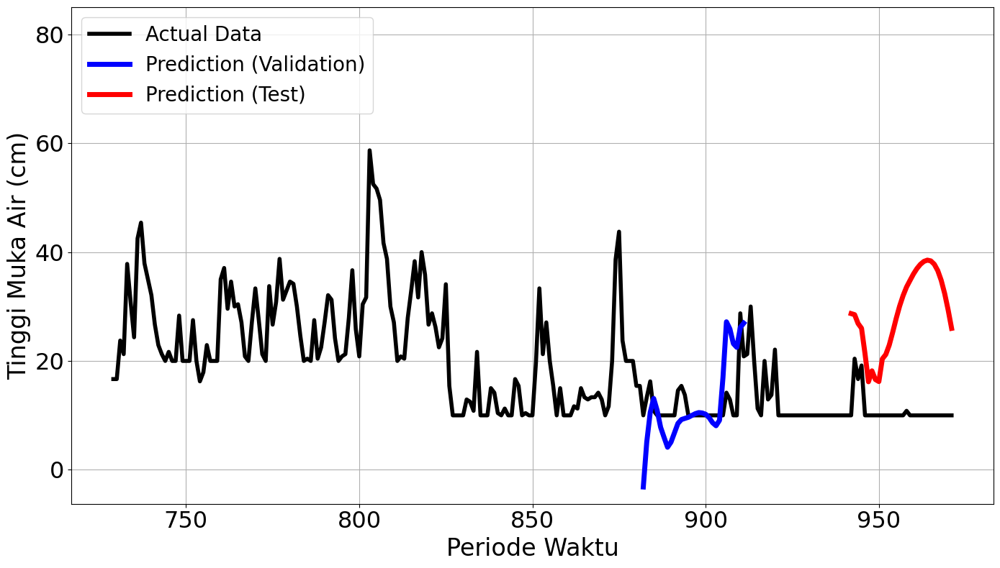

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.2292 - val_loss: 0.0191
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - loss: 0.1169 - val_loss: 0.0215
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - loss: 0.0978 - val_loss: 0.0227
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0911 - val_loss: 0.0218
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.0453 - val_loss: 0.0210
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0773Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - loss: 0.0773 - val_loss: 0.0226
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
mape validation = 34.82622382760053 %
mape test = 19.179454670594648 %


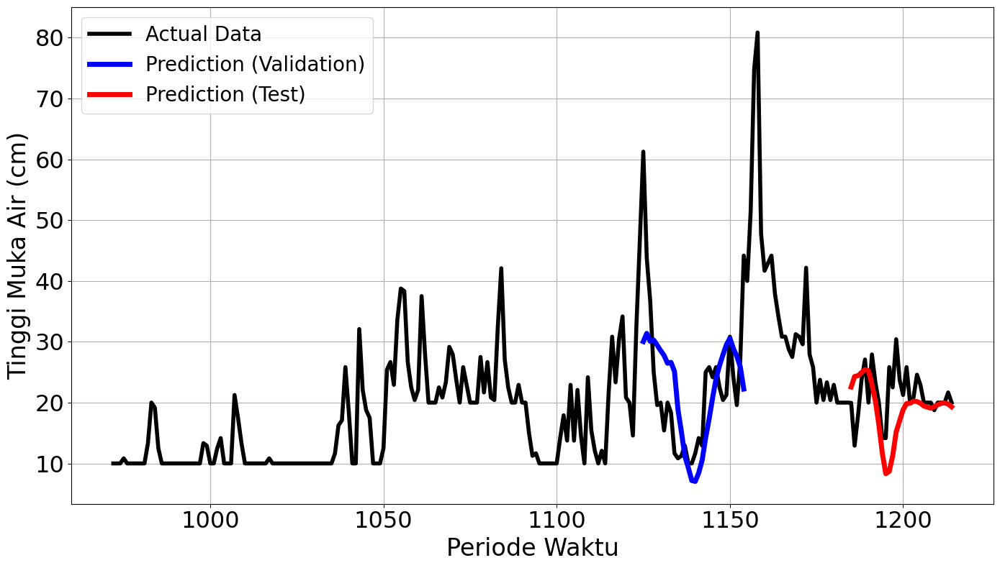

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.4486
Final Average MAPE Test: 1.1204
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.1600 - val_loss: 0.0794
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0881 - val_loss: 0.0330
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0341 - val_loss: 0.0724
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0247 - val_loss: 0.0643
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0140 - val_loss: 0.0523
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0090 - val_loss: 0.0360
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0069 - val_loss: 0.0279
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0075 - val_loss: 0.0273
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0080 - val_loss: 0.0256
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0048 - val_loss: 0.0320
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0078 - val_loss: 0.0312
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0063 - val_loss: 0.0276


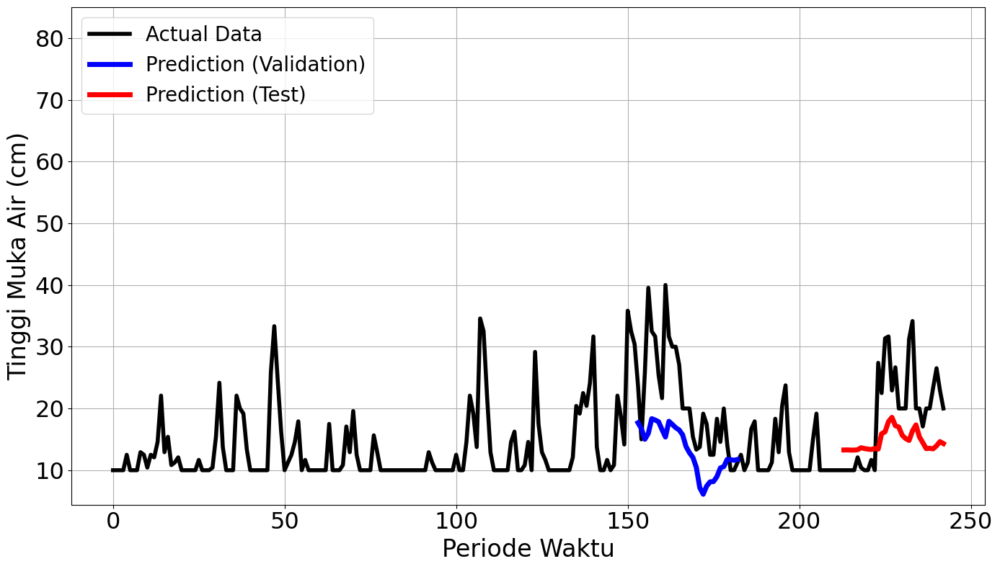

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 140ms/step - loss: 0.1499 - val_loss: 0.0958
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.1084 - val_loss: 0.0873
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0668 - val_loss: 0.0631
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0328 - val_loss: 0.0550
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0282 - val_loss: 0.0451
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0305 - val_loss: 0.0443
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0212 - val_loss: 0.0477
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0216 - val_loss: 0.0437
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0238 - val_loss: 0.0416
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0202 - val_loss: 0.0415
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0247 - val_loss: 0.0394
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.0206 - val_loss: 0.0413


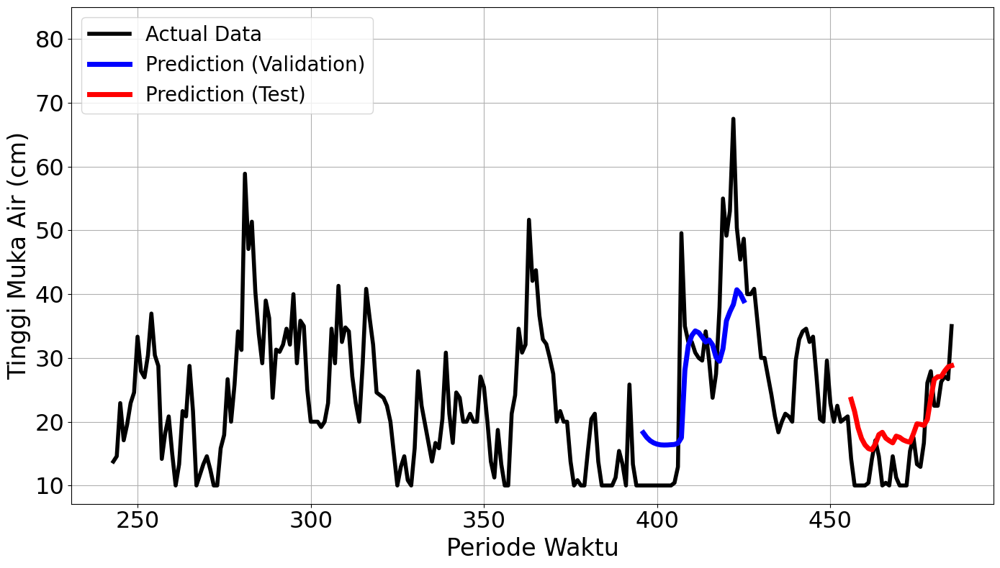

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 179ms/step - loss: 0.1008 - val_loss: 4.1827e-04
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0885 - val_loss: 0.0014
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0697 - val_loss: 0.0110
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0323 - val_loss: 4.0725e-04
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0213 - val_loss: 7.7918e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0250 - val_loss: 2.9154e-04
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0090 - val_loss: 0.0038
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0138 - val_loss: 0.0025
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0091 - val_loss: 7.5264e-04
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0100 - val_loss: 0.0030
Epoch 11/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0086Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5

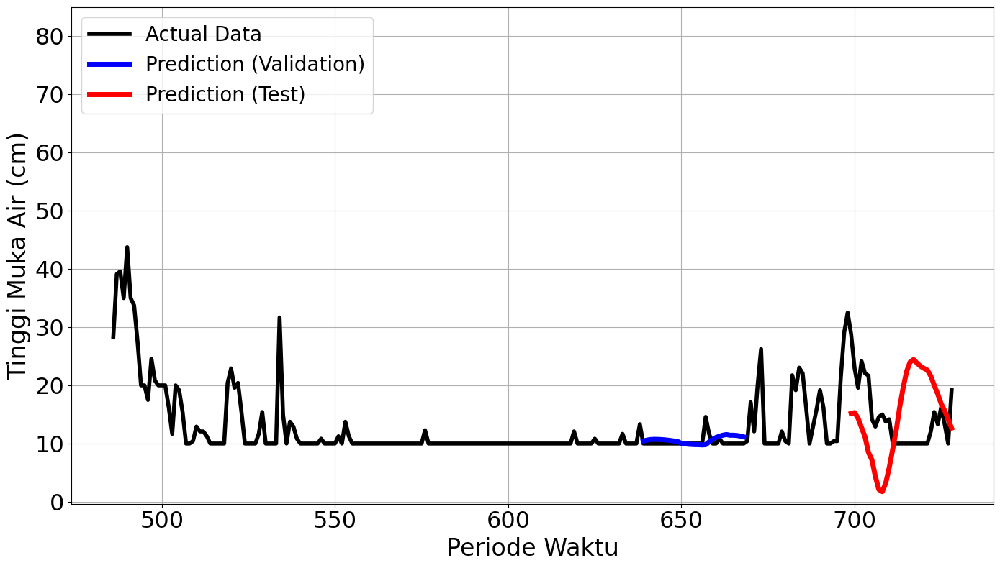

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.2440 - val_loss: 0.1141
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0832 - val_loss: 0.0560
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0490 - val_loss: 0.0174
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0379 - val_loss: 0.0321
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0556 - val_loss: 0.0078
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0282 - val_loss: 0.0063
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0209 - val_loss: 0.0185
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0292 - val_loss: 0.0191
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0212 - val_loss: 0.0043
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0257 - val_loss: 0.0066
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0205 - val_loss: 0.0059
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0192 - val_loss: 0.0063


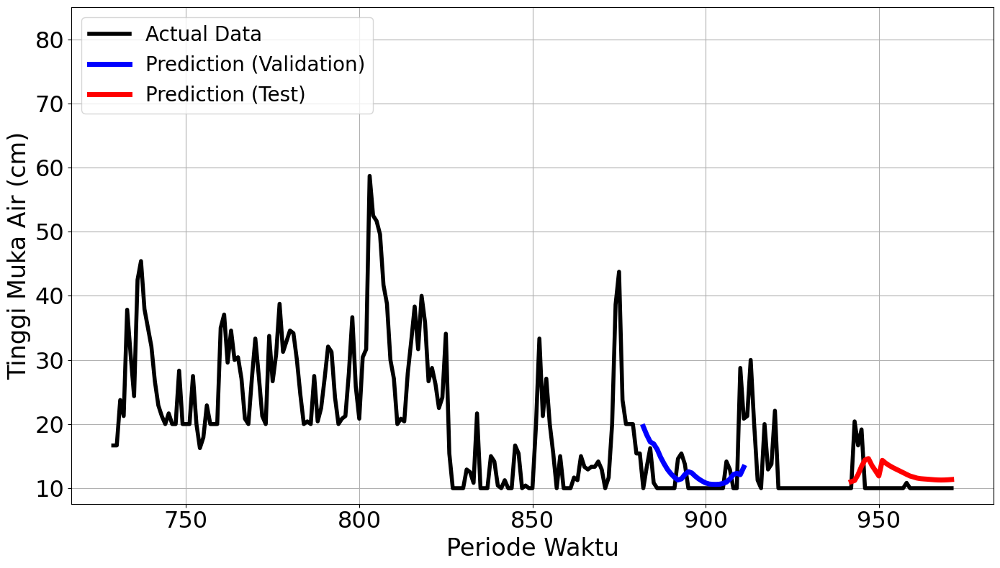

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 135ms/step - loss: 0.1269 - val_loss: 0.0370
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0502 - val_loss: 0.0389
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0345 - val_loss: 0.0411
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0293 - val_loss: 0.0306
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0218 - val_loss: 0.0287
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0246 - val_loss: 0.0254
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0146 - val_loss: 0.0251
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0148 - val_loss: 0.0254
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0137 - val_loss: 0.0260
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0137 - val_loss: 0.0248
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0066 - val_loss: 0.0249
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0085 - val_loss: 0.0249


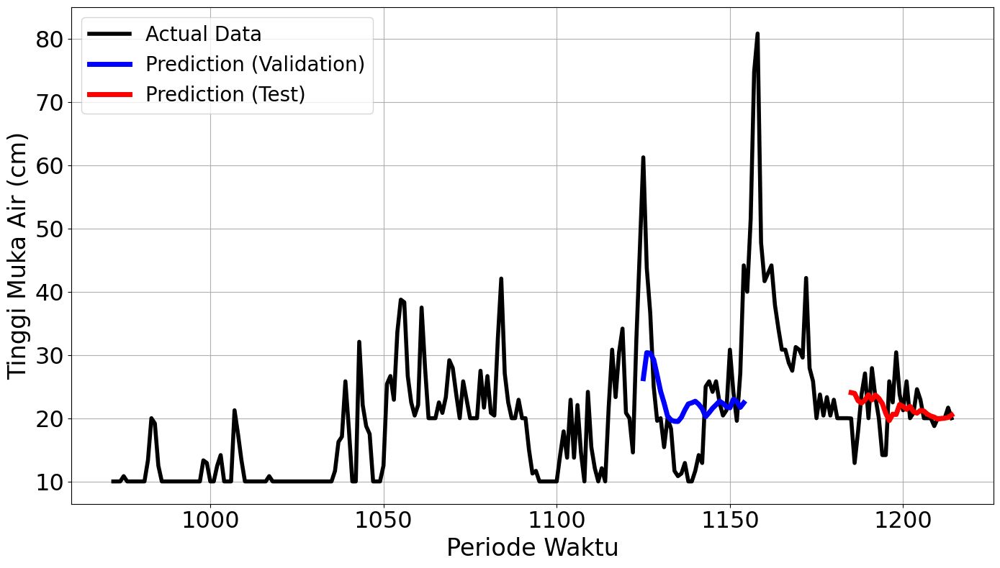

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2911
Final Average MAPE Test: 0.3623
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 136ms/step - loss: 0.1600 - val_loss: 0.0794
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0881 - val_loss: 0.0330
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0341 - val_loss: 0.0724
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0247 - val_loss: 0.0643
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0140 - val_loss: 0.0523
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0090 - val_loss: 0.0360
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0069 - val_loss: 0.0279
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0075 - val_loss: 0.0273
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0080 - val_loss: 0.0256
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0048 - val_loss: 0.0320
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0078 - val_loss: 0.0312
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0063 - val_loss: 0.0276


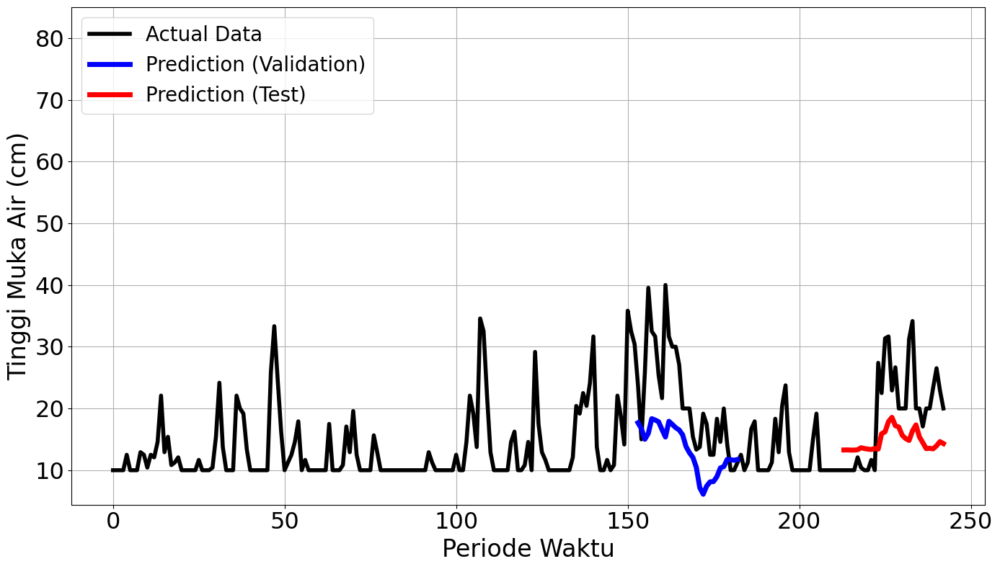

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 144ms/step - loss: 0.1499 - val_loss: 0.0958
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.1084 - val_loss: 0.0873
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0668 - val_loss: 0.0631
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0328 - val_loss: 0.0550
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0282 - val_loss: 0.0451
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0305 - val_loss: 0.0443
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0212 - val_loss: 0.0477
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0216 - val_loss: 0.0437
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0238 - val_loss: 0.0416
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0202 - val_loss: 0.0415
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0247 - val_loss: 0.0394
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0206 - val_loss: 0.0413


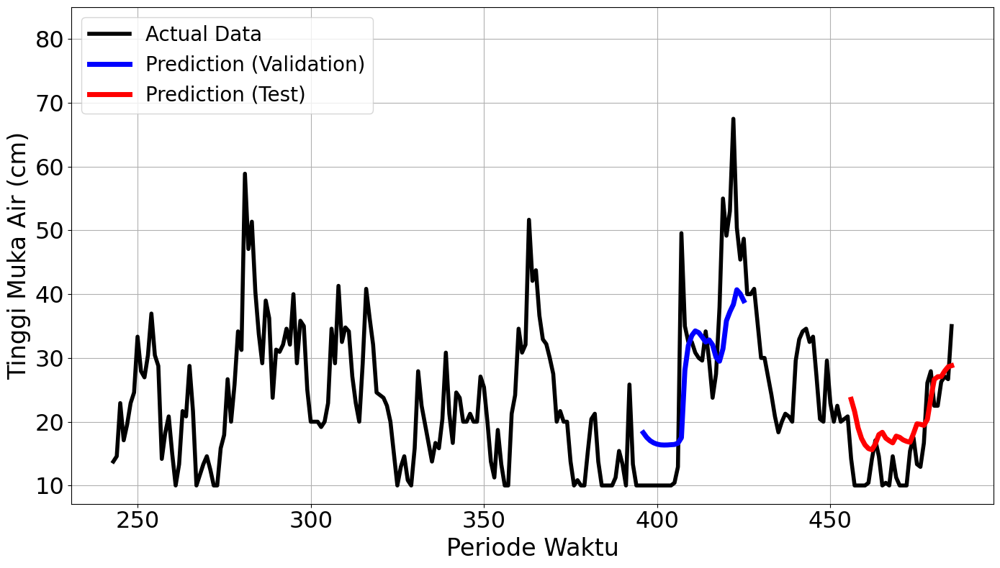

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 134ms/step - loss: 0.1008 - val_loss: 4.1827e-04
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0885 - val_loss: 0.0014
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0697 - val_loss: 0.0110
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0323 - val_loss: 4.0725e-04
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0213 - val_loss: 7.7918e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0250 - val_loss: 2.9154e-04
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0090 - val_loss: 0.0038
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0138 - val_loss: 0.0025
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0091 - val_loss: 7.5264e-04
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0100 - val_loss: 0.0030
Epoch 11/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0086Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 5

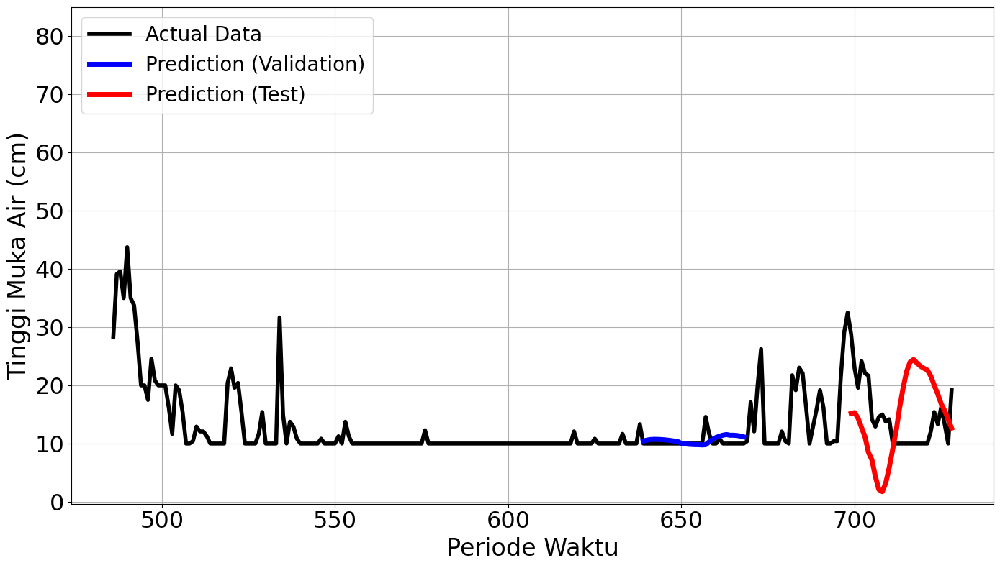

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.2440 - val_loss: 0.1141
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0832 - val_loss: 0.0560
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0490 - val_loss: 0.0174
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0379 - val_loss: 0.0321
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0556 - val_loss: 0.0078
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0282 - val_loss: 0.0063
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0209 - val_loss: 0.0185
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0292 - val_loss: 0.0191
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0212 - val_loss: 0.0043
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0257 - val_loss: 0.0066
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0205 - val_loss: 0.0059
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0192 - val_loss: 0.0063


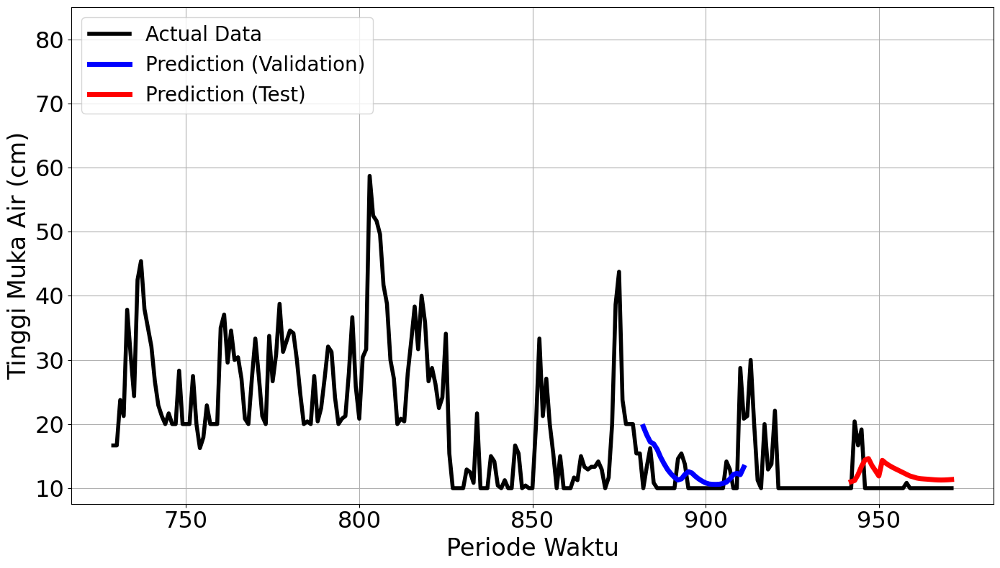

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 143ms/step - loss: 0.1269 - val_loss: 0.0370
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0502 - val_loss: 0.0389
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0345 - val_loss: 0.0411
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0293 - val_loss: 0.0306
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0218 - val_loss: 0.0287
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0246 - val_loss: 0.0254
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0146 - val_loss: 0.0251
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0148 - val_loss: 0.0254
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0137 - val_loss: 0.0260
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0137 - val_loss: 0.0248
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0066 - val_loss: 0.0249
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0085 - val_loss: 0.0249


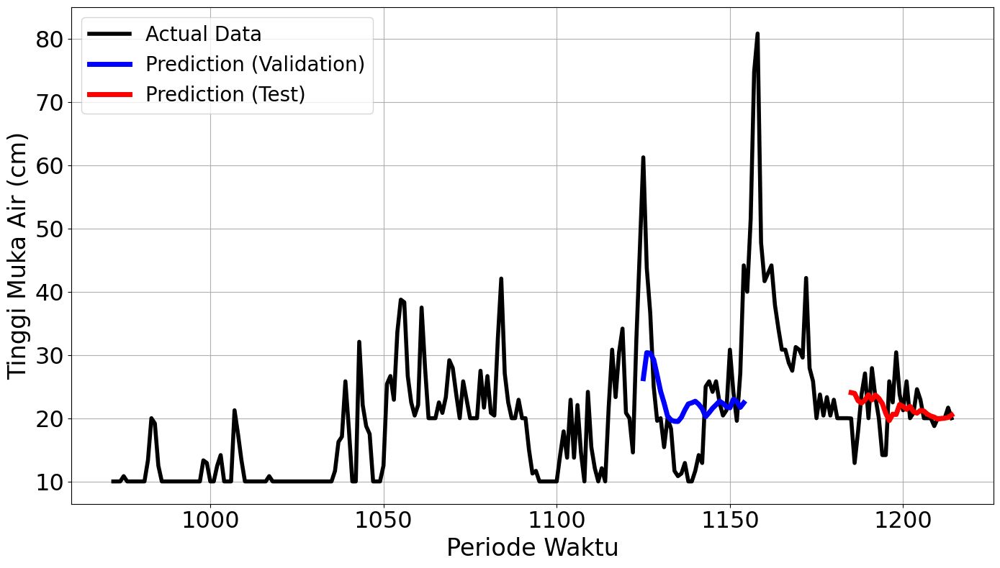

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2911
Final Average MAPE Test: 0.3623
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 303ms/step - loss: 0.1082 - val_loss: 0.0692
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0568 - val_loss: 0.0717
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0333 - val_loss: 0.0630
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0181 - val_loss: 0.0308
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0148 - val_loss: 0.0242
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0144 - val_loss: 0.0251
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0109 - val_loss: 0.0193
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0108 - val_loss: 0.0171
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0069 - val_loss: 0.0183
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0073 - val_loss: 0.0187
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0070 - val_loss: 0.0182
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0059 - val_loss: 0.0173


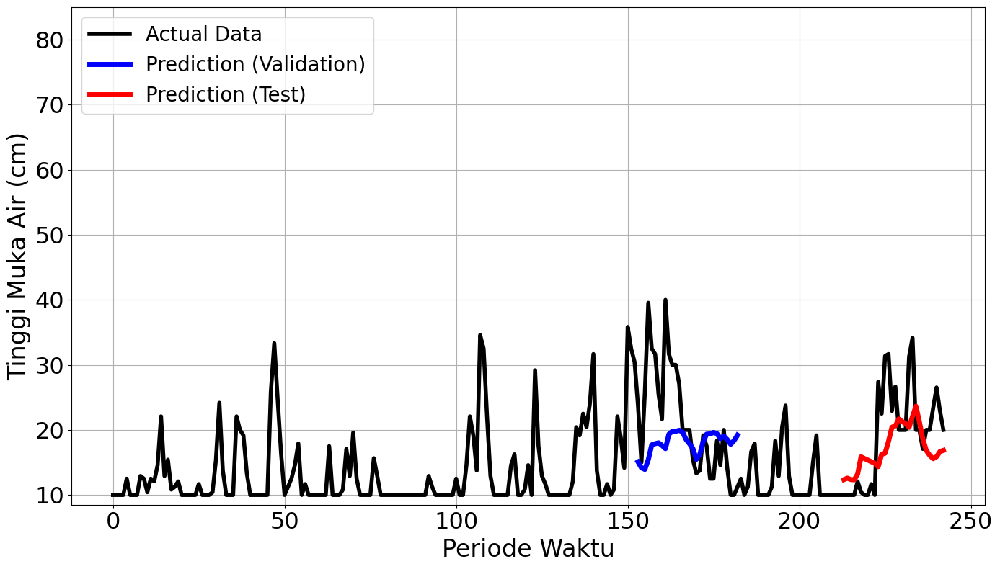

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 301ms/step - loss: 0.1495 - val_loss: 0.0980
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0803 - val_loss: 0.0525
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0627 - val_loss: 0.0440
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0359 - val_loss: 0.0392
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0434 - val_loss: 0.0421
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0288 - val_loss: 0.0497
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0303 - val_loss: 0.0445
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0249 - val_loss: 0.0400
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0265 Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0269 - val_loss: 0.0398
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
mape validation = 50.98274304496275 %
map

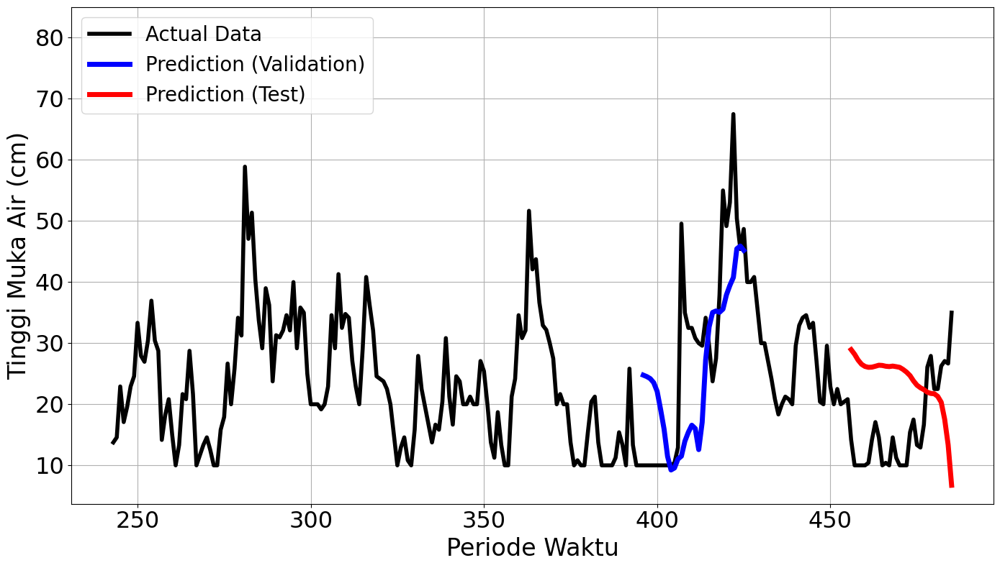

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 307ms/step - loss: 0.0717 - val_loss: 0.0066
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0650 - val_loss: 0.0485
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0699 - val_loss: 0.0037
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0373 - val_loss: 0.0042
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0278 - val_loss: 0.0054
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0229 - val_loss: 0.0011
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0167 - val_loss: 0.0041
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0076 - val_loss: 2.9113e-04
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.0076 - val_loss: 3.6798e-04
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0098 - val_loss: 5.9449e-04
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0065 - val_loss: 4.8171e-04
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.006

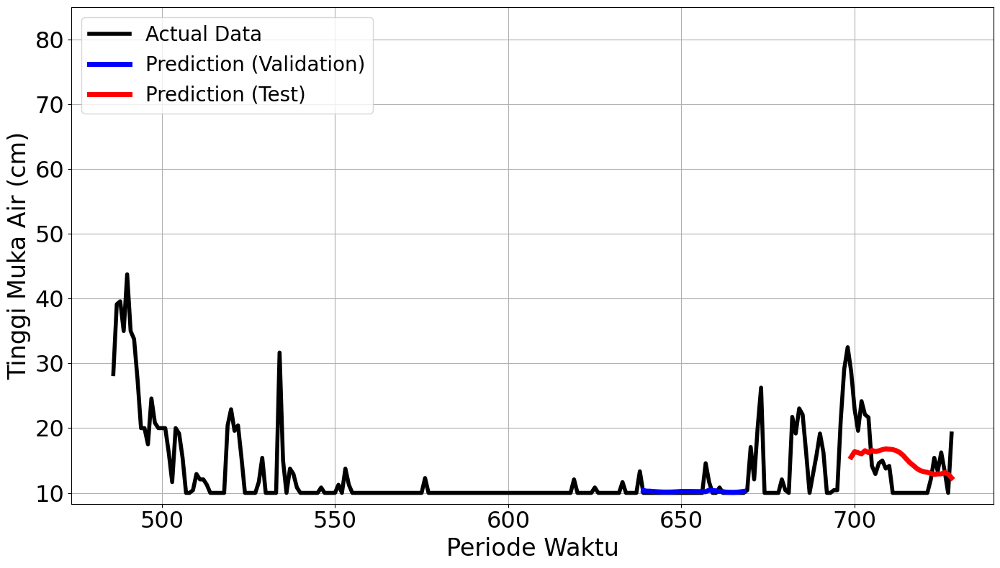

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 499ms/step - loss: 0.1945 - val_loss: 0.4256
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0735 - val_loss: 0.0718
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0571 - val_loss: 0.0248
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0332 - val_loss: 0.0191
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0374 - val_loss: 0.0052
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0341 - val_loss: 0.0055
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0334 - val_loss: 0.0175
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0327 - val_loss: 0.0207
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0301 - val_loss: 0.0132
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0212 Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0215 - val_loss: 0.0070
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43

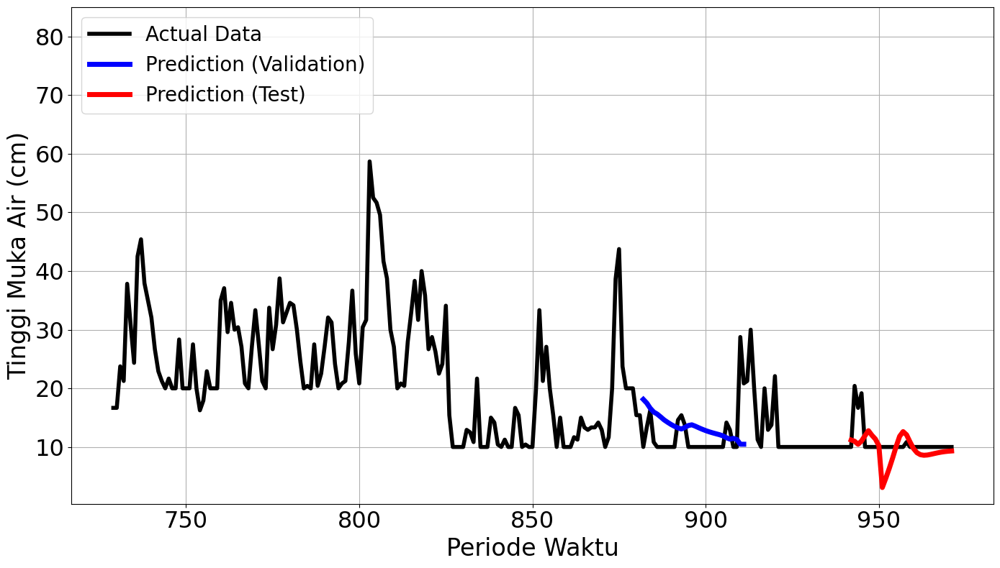

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 294ms/step - loss: 0.2278 - val_loss: 0.0785
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0674 - val_loss: 0.0820
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0970 - val_loss: 0.0353
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0394 - val_loss: 0.0381
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0343 - val_loss: 0.0318
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0278 - val_loss: 0.0271
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0215 - val_loss: 0.0260
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0247 - val_loss: 0.0242
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0145 - val_loss: 0.0244
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0117 - val_loss: 0.0240
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0136 - val_loss: 0.0241
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0111 - val_loss: 0.0235


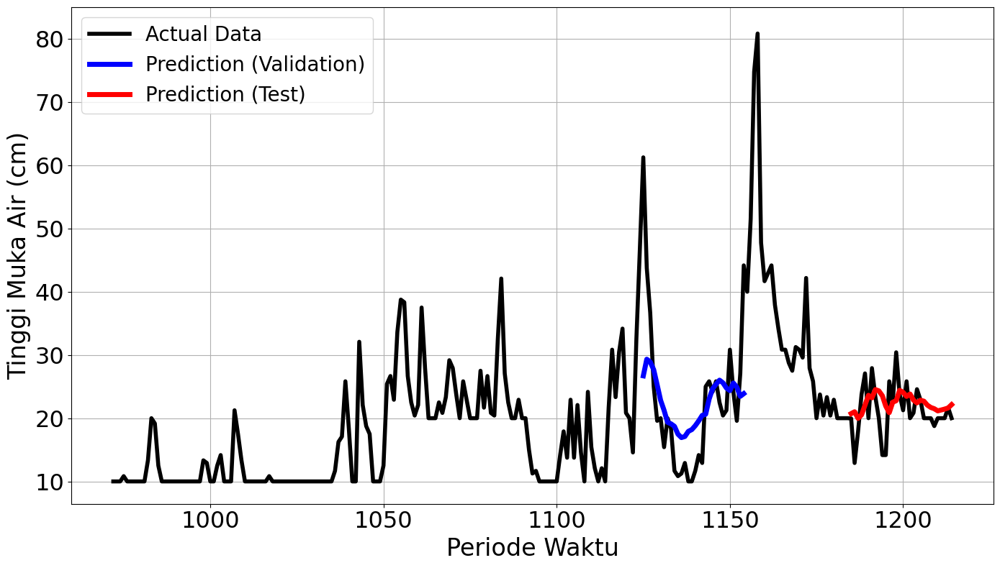

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2986
Final Average MAPE Test: 0.3757
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 497ms/step - loss: 0.1082 - val_loss: 0.0692
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0568 - val_loss: 0.0717
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0333 - val_loss: 0.0630
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0181 - val_loss: 0.0308
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0148 - val_loss: 0.0242
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0144 - val_loss: 0.0251
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0109 - val_loss: 0.0193
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0108 - val_loss: 0.0171
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0069 - val_loss: 0.0183
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0073 - val_loss: 0.0187
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0070 - val_loss: 0.0182
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0059 - val_loss: 0.017

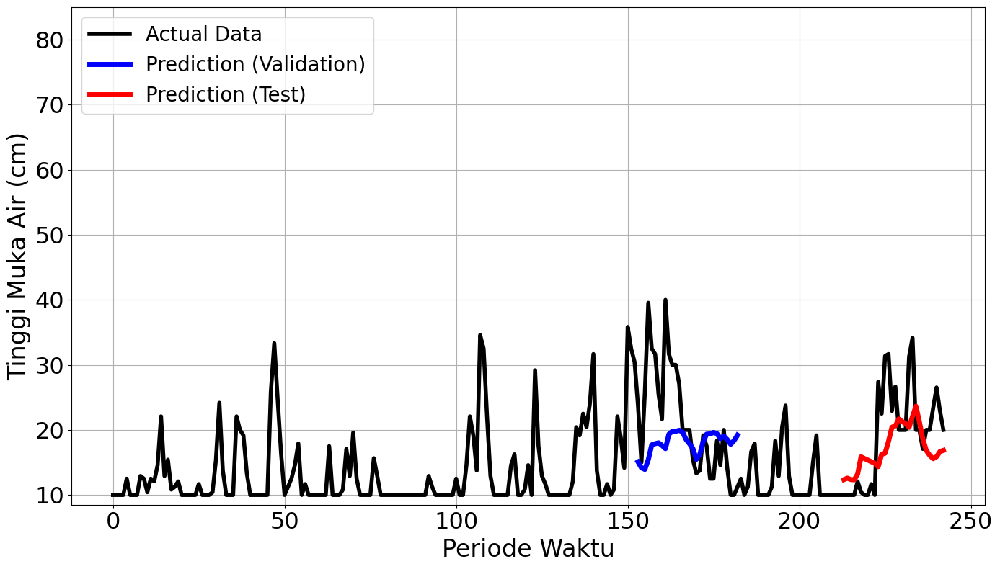

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 382ms/step - loss: 0.1495 - val_loss: 0.0980
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0803 - val_loss: 0.0525
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0627 - val_loss: 0.0440
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0359 - val_loss: 0.0392
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0434 - val_loss: 0.0421
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0288 - val_loss: 0.0497
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.0303 - val_loss: 0.0445
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0249 - val_loss: 0.0400
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0265 Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - loss: 0.0269 - val_loss: 0.0398
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
mape validation = 50.98274304496275

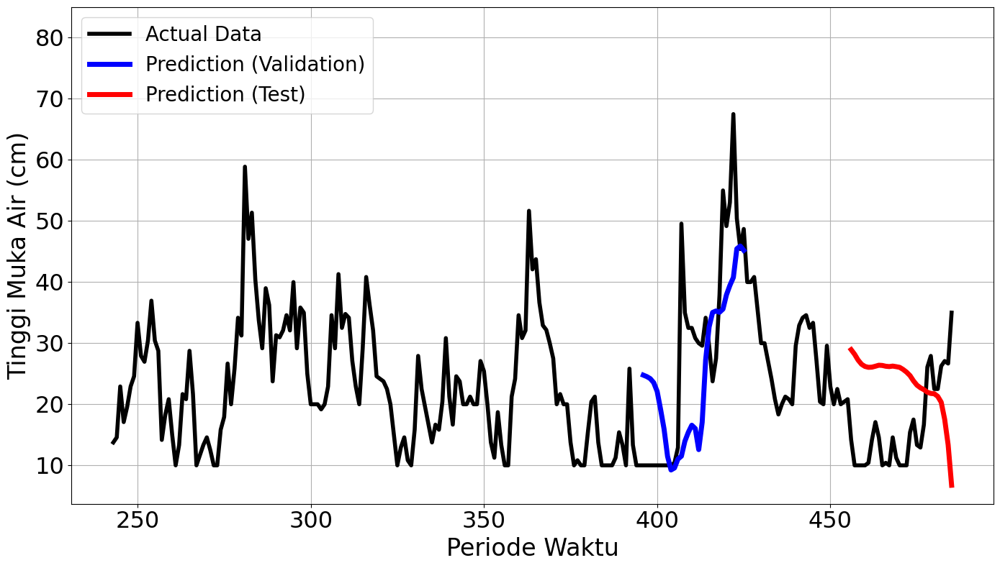

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 292ms/step - loss: 0.0717 - val_loss: 0.0066
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.0650 - val_loss: 0.0485
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0699 - val_loss: 0.0037
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0373 - val_loss: 0.0042
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0278 - val_loss: 0.0054
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0229 - val_loss: 0.0011
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0167 - val_loss: 0.0041
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0076 - val_loss: 2.9113e-04
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0076 - val_loss: 3.6798e-04
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0098 - val_loss: 5.9449e-04
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0065 - val_loss: 4.8171e-04
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0061 - v

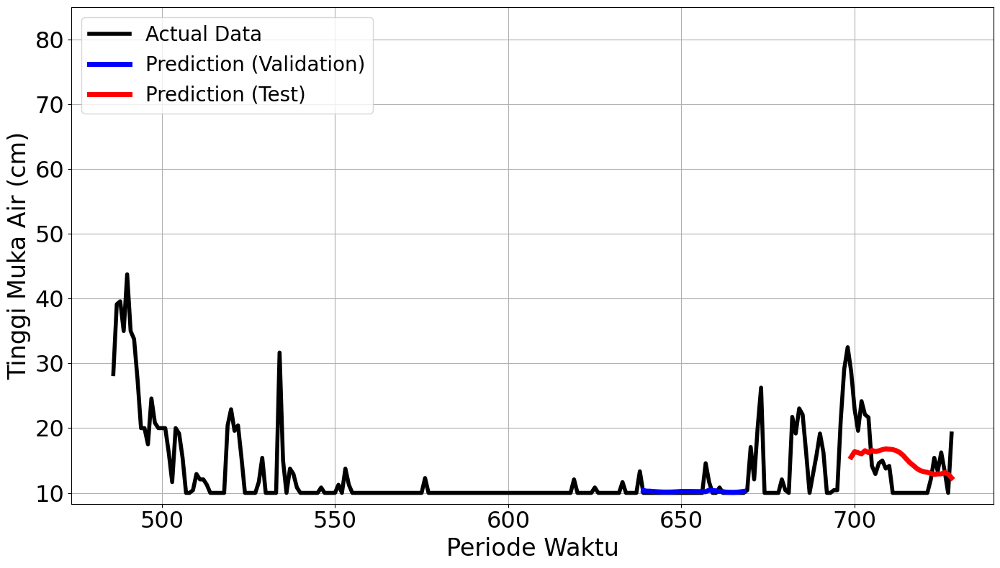

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 379ms/step - loss: 0.1945 - val_loss: 0.4256
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0735 - val_loss: 0.0718
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0571 - val_loss: 0.0248
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0332 - val_loss: 0.0191
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0374 - val_loss: 0.0052
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0341 - val_loss: 0.0055
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0334 - val_loss: 0.0175
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0327 - val_loss: 0.0207
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0301 - val_loss: 0.0132
Epoch 10/150
2/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0206 Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0215 - val_loss: 0.0070
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 57

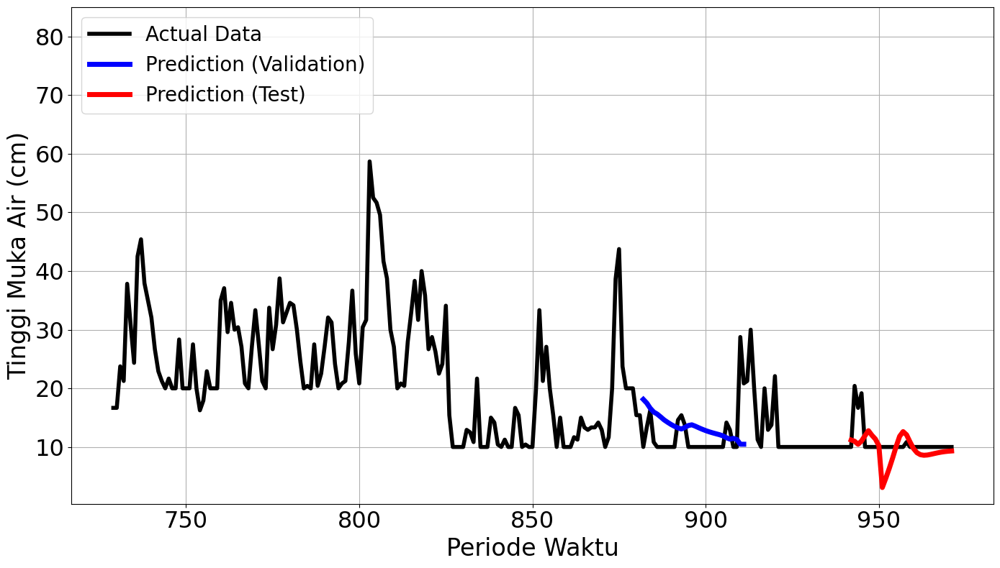

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 402ms/step - loss: 0.2278 - val_loss: 0.0785
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.0674 - val_loss: 0.0820
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0970 - val_loss: 0.0353
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0394 - val_loss: 0.0381
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0343 - val_loss: 0.0318
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0278 - val_loss: 0.0271
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0215 - val_loss: 0.0260
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0247 - val_loss: 0.0242
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0145 - val_loss: 0.0244
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0117 - val_loss: 0.0240
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0136 - val_loss: 0.0241
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0111 - val_loss: 0.0235


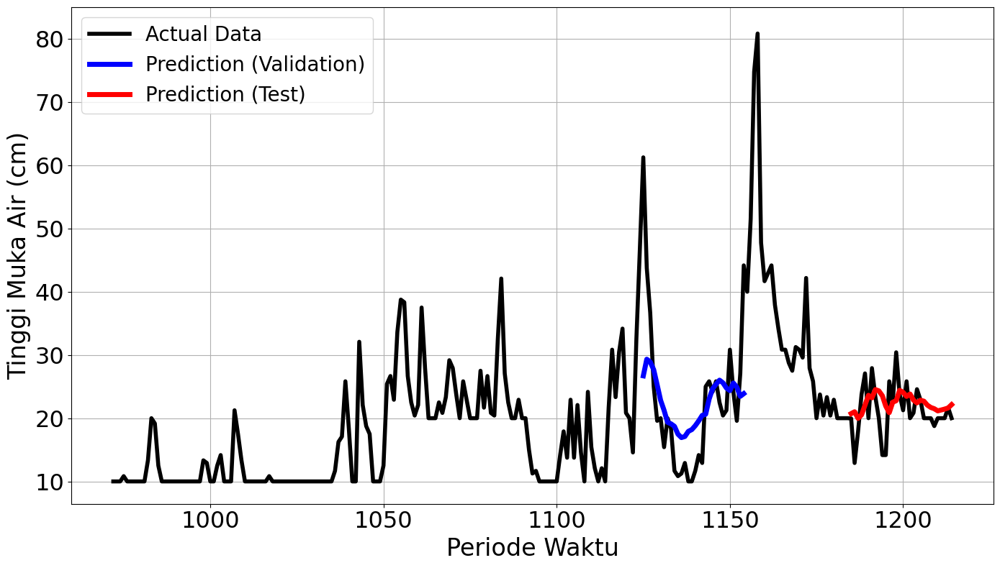

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2986
Final Average MAPE Test: 0.3757
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 952ms/step - loss: 0.2882 - val_loss: 0.2686
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0825 - val_loss: 0.0885
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0454 - val_loss: 0.0221
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0261 - val_loss: 0.0273
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0279 - val_loss: 0.0354
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0337 - val_loss: 0.0269
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0171 - val_loss: 0.0207
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0168 - val_loss: 0.0218
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0204 - val_loss: 0.0172
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0104 - val_loss: 0.0119
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0078 - val_loss: 0.0097
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0110 - val_lo

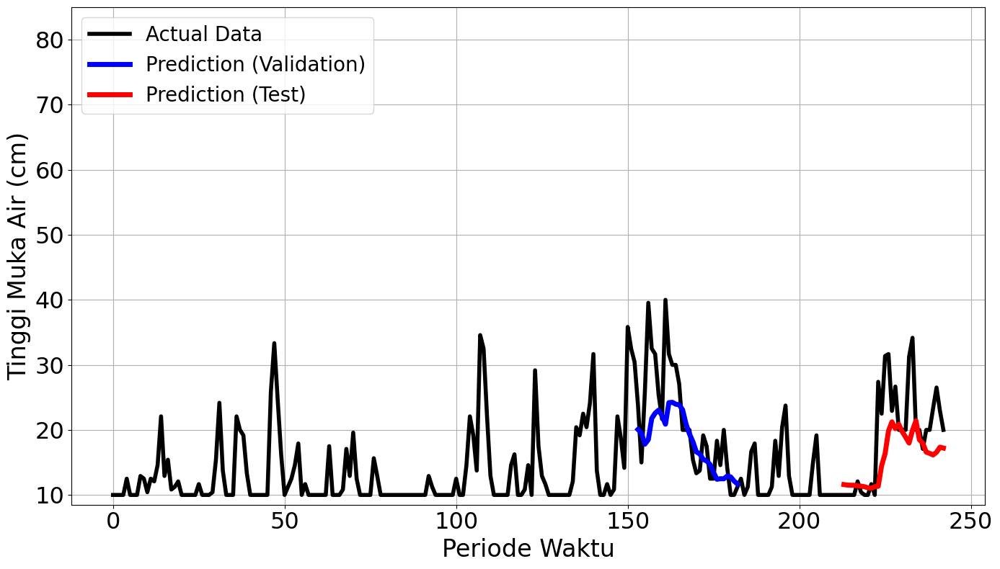

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 772ms/step - loss: 0.1215 - val_loss: 0.0469
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1128 - val_loss: 0.0305
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0926 - val_loss: 0.0720
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - loss: 0.0966 - val_loss: 0.0499
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0810 - val_loss: 0.0418
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0545 - val_loss: 0.0374
Epoch 7/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0424Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0409 - val_loss: 0.0393
Epoch 00007: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
mape validation = 58.93809334889536 %
mape test = 66.83842736751731 %


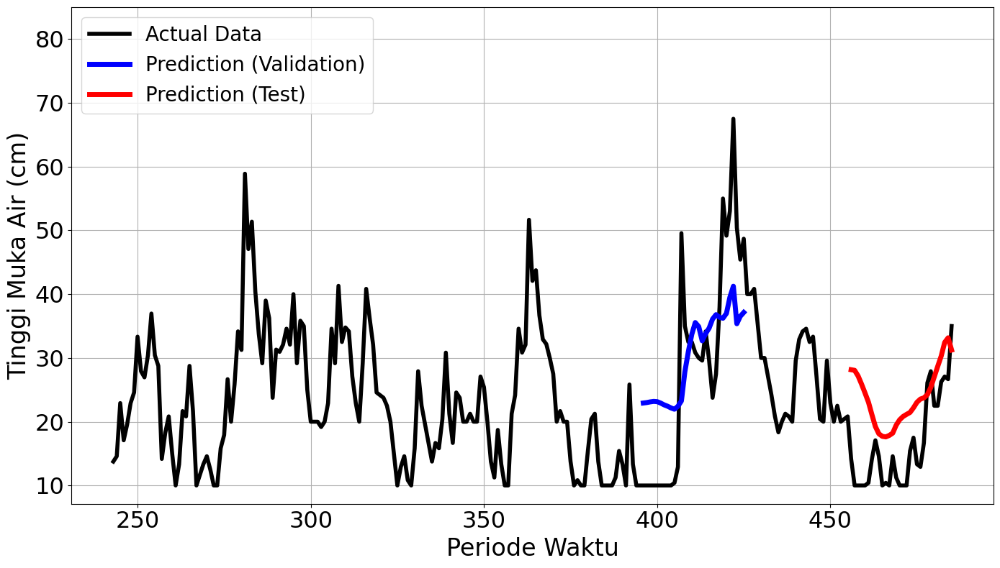

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 528ms/step - loss: 0.2961 - val_loss: 0.0087
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1135 - val_loss: 0.0146
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0476 - val_loss: 2.2313e-04
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0299 - val_loss: 4.4630e-04
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0339 - val_loss: 0.0021
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0384 - val_loss: 0.0018
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0201 - val_loss: 0.0011
Epoch 8/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step - loss: 0.0331Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0275 - val_loss: 5.5048e-04
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
mape validation = 7.68985280820344 %
mape test = 62.67912680539964 %


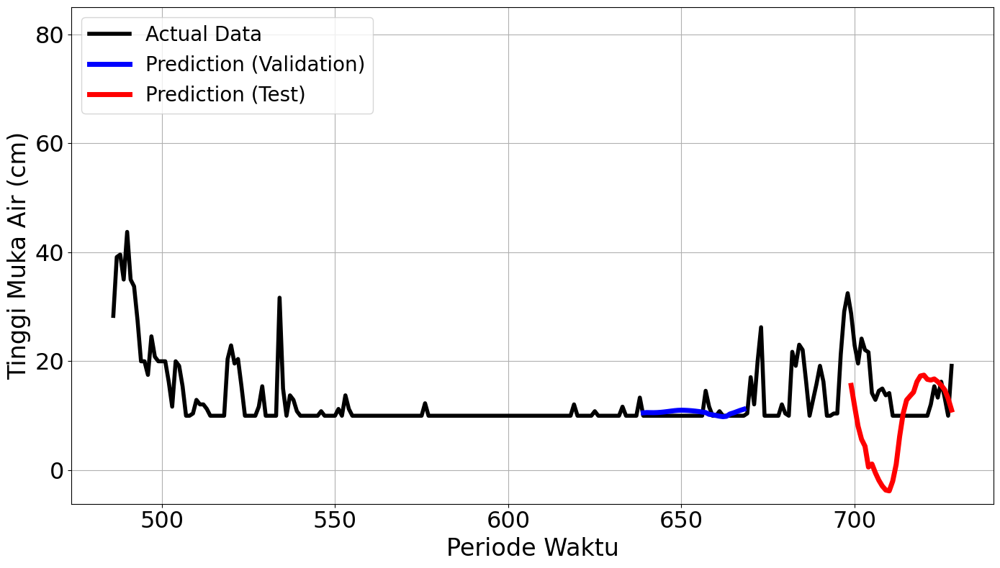

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 706ms/step - loss: 0.2370 - val_loss: 0.2846
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.2121 - val_loss: 0.0058
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0943 - val_loss: 0.0110
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1057 - val_loss: 0.0084
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0711 - val_loss: 0.0105
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0834 - val_loss: 0.0122
Epoch 7/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - loss: 0.0633Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0580 - val_loss: 0.0139
Epoch 00007: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
mape validation = 35.65128929563021 %
mape test = 63.692485344644886 %


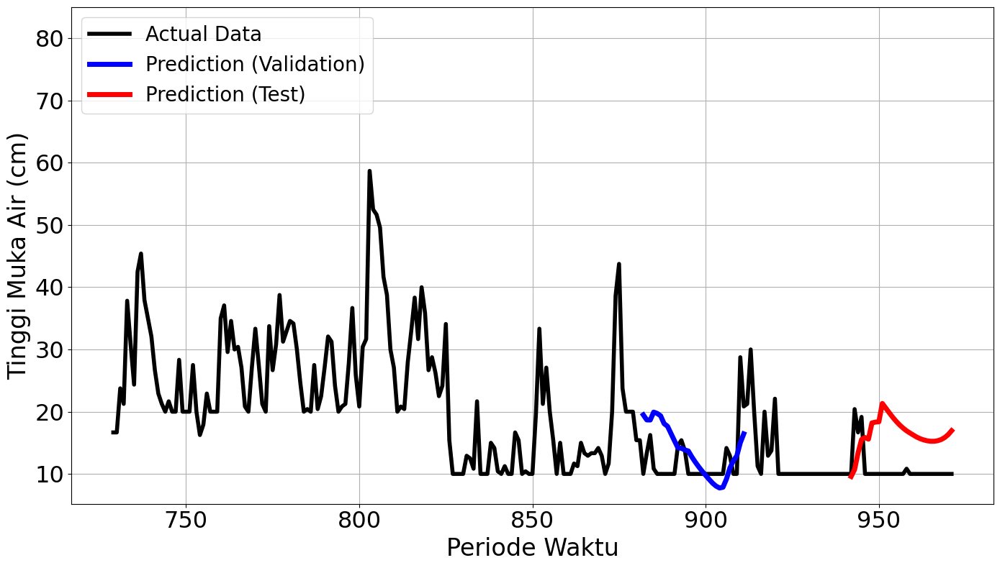

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 574ms/step - loss: 0.1959 - val_loss: 0.0488
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0923 - val_loss: 0.0841
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0902 - val_loss: 0.0280
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0438 - val_loss: 0.0315
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0337 - val_loss: 0.0278
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0240 - val_loss: 0.0239
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0199 - val_loss: 0.0283
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0212 - val_loss: 0.0260
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - loss: 0.0208 - val_loss: 0.0214
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - loss: 0.0149 - val_loss: 0.0233
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - loss: 0.0146 - val_loss: 0.0218
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0200 - val_lo

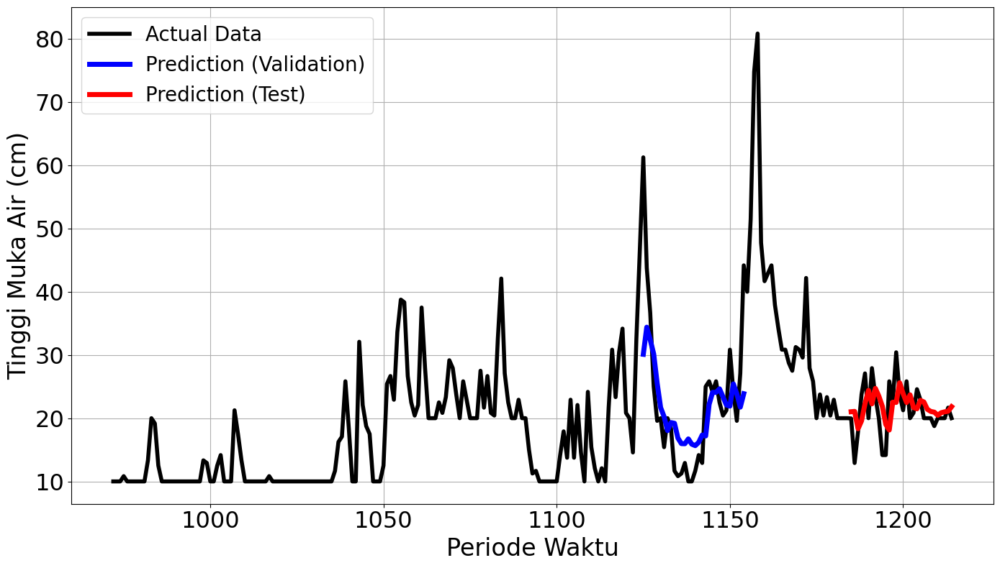

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2979
Final Average MAPE Test: 0.4551
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 769ms/step - loss: 0.2882 - val_loss: 0.2686
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0825 - val_loss: 0.0885
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0454 - val_loss: 0.0221
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0261 - val_loss: 0.0273
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0279 - val_loss: 0.0354
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0337 - val_loss: 0.0269
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0171 - val_loss: 0.0207
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - loss: 0.0168 - val_loss: 0.0218
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step - loss: 0.0204 - val_loss: 0.0172
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.0104 - val_loss: 0.0119
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - loss: 0.0078 - val_loss: 0.0097
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - loss: 0.0110 - val_lo

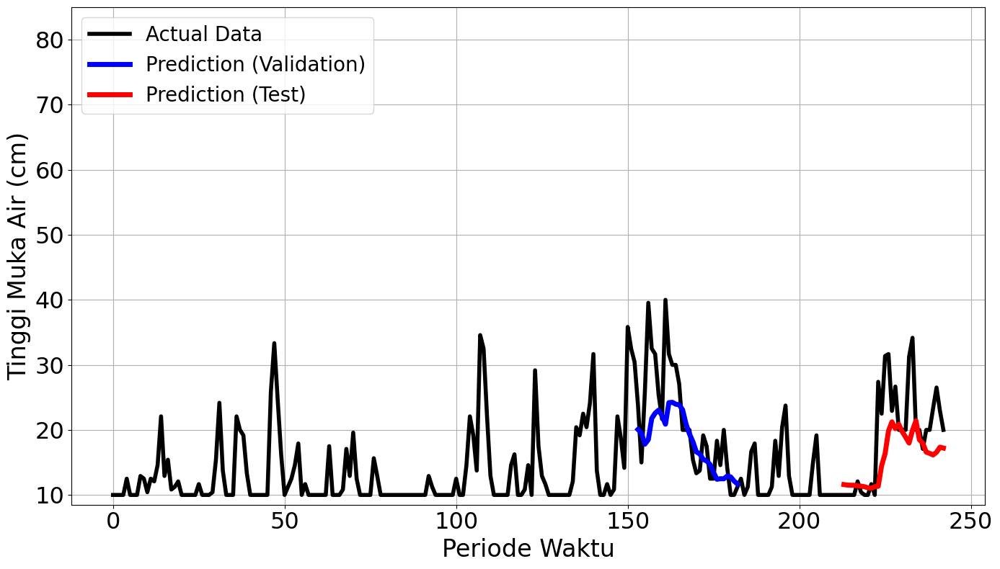

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 720ms/step - loss: 0.1215 - val_loss: 0.0469
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.1128 - val_loss: 0.0305
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0926 - val_loss: 0.0720
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0966 - val_loss: 0.0499
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0810 - val_loss: 0.0418
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0545 - val_loss: 0.0374
Epoch 7/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0424Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0409 - val_loss: 0.0393
Epoch 00007: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
mape validation = 58.93809334889536 %
mape test = 66.83842736751731 %


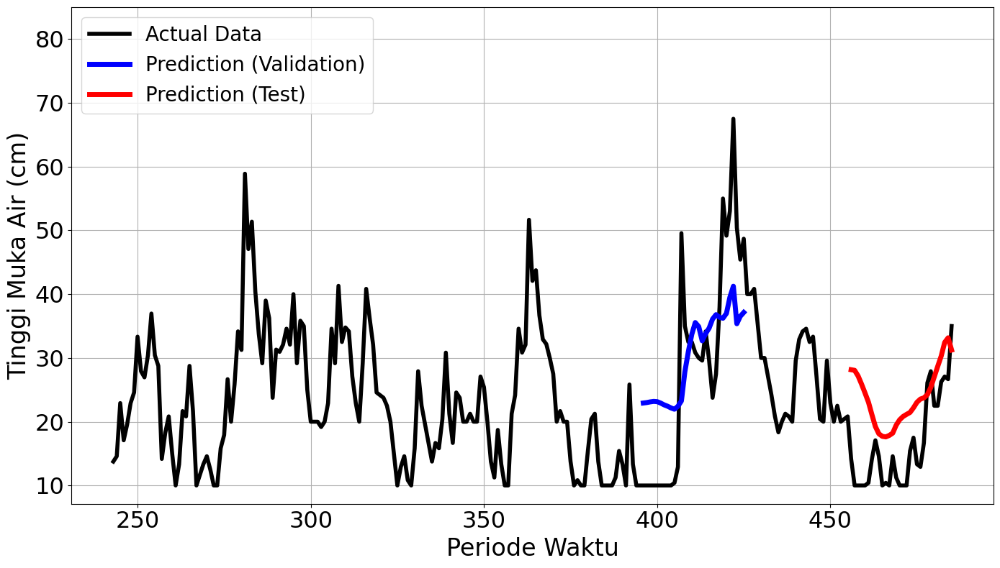

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 925ms/step - loss: 0.2961 - val_loss: 0.0087
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.1135 - val_loss: 0.0146
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0476 - val_loss: 2.2313e-04
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0299 - val_loss: 4.4630e-04
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0339 - val_loss: 0.0021
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0384 - val_loss: 0.0018
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0201 - val_loss: 0.0011
Epoch 8/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0331Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0275 - val_loss: 5.5048e-04
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
mape validation = 7.68985280820344 %
mape test = 62.67912680539964 %


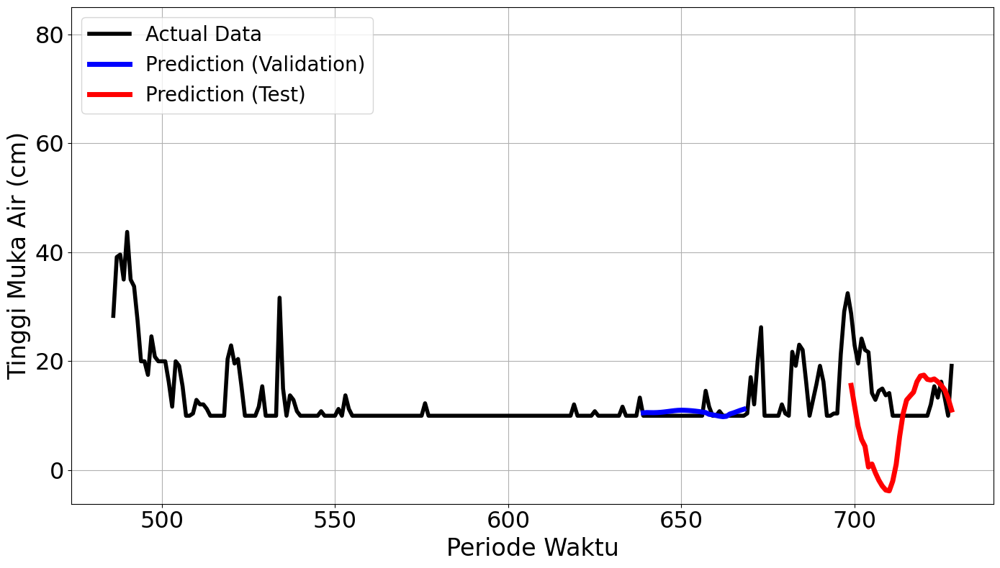

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 784ms/step - loss: 0.2370 - val_loss: 0.2846
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.2121 - val_loss: 0.0058
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0943 - val_loss: 0.0110
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.1057 - val_loss: 0.0084
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0711 - val_loss: 0.0105
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0834 - val_loss: 0.0122
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0593 Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - loss: 0.0580 - val_loss: 0.0139
Epoch 00007: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 591ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
mape validation = 35.65128929563021 %
mape test = 63.692485344644886 %


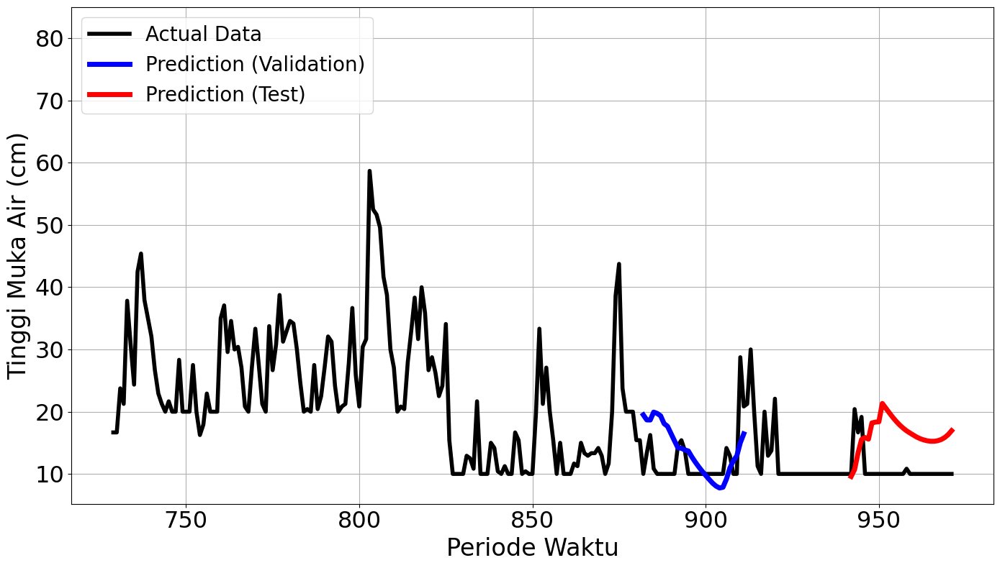

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 575ms/step - loss: 0.1959 - val_loss: 0.0488
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0923 - val_loss: 0.0841
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0902 - val_loss: 0.0280
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0438 - val_loss: 0.0315
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0337 - val_loss: 0.0278
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0240 - val_loss: 0.0239
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0199 - val_loss: 0.0283
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0212 - val_loss: 0.0260
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0208 - val_loss: 0.0214
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0149 - val_loss: 0.0233
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0146 - val_loss: 0.0218
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0200 - val_lo

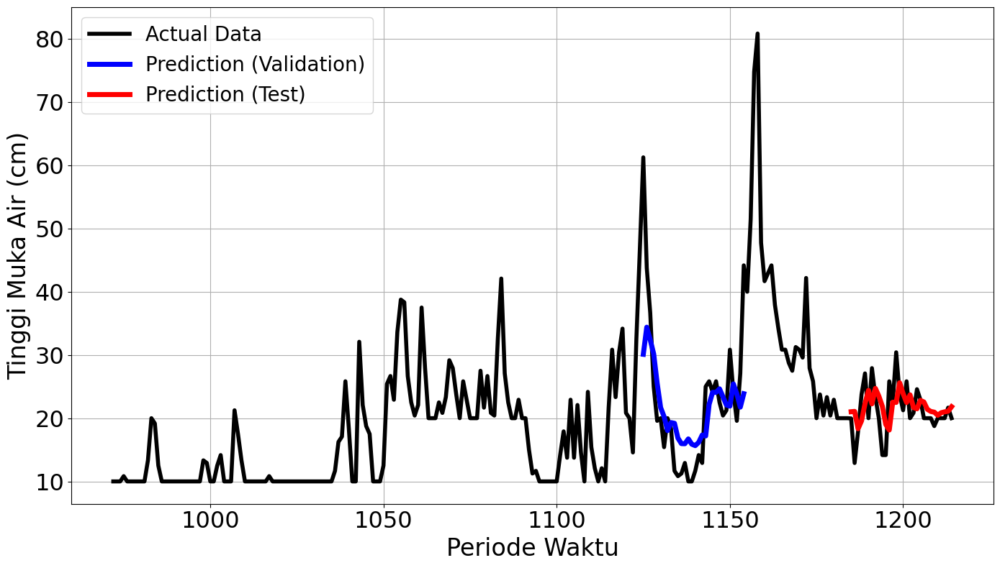

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2979
Final Average MAPE Test: 0.4551
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.2733 - val_loss: 0.2117
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step - loss: 0.0907 - val_loss: 0.2352
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0480 - val_loss: 0.1565
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0488 - val_loss: 0.0991
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step - loss: 0.0366 - val_loss: 0.0908
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0279 - val_loss: 0.0919
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step - loss: 0.0238 - val_loss: 0.0875
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0248 - val_loss: 0.0818
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - loss: 0.0242 - val_loss: 0.0643
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0183 - val_loss: 0.0454
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0221 - val_loss: 0.0272
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step - loss: 0.0167 - val_loss:

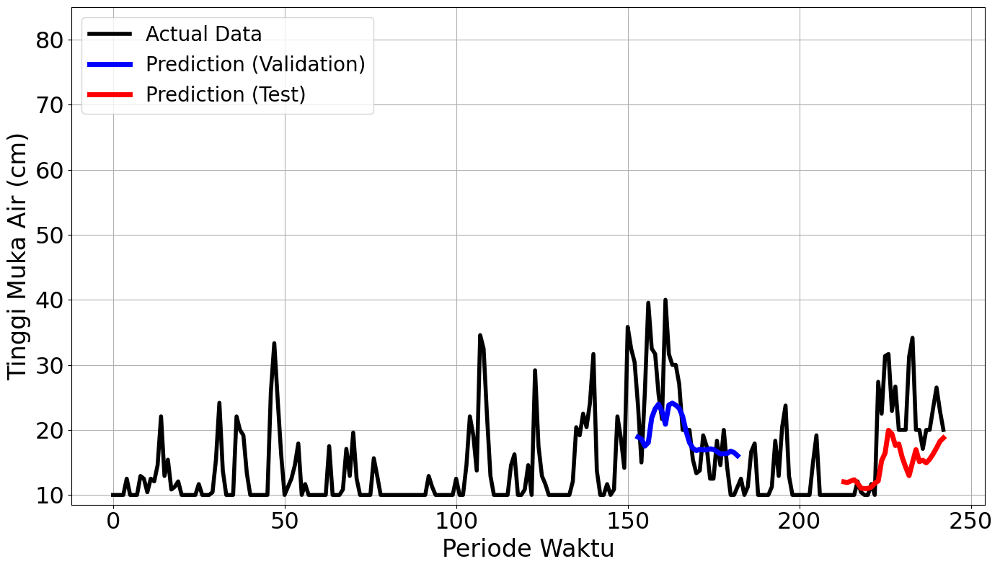

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.1435 - val_loss: 0.2698
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2648 - val_loss: 0.1086
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step - loss: 0.1213 - val_loss: 0.0453
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - loss: 0.1060 - val_loss: 0.0411
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step - loss: 0.0902 - val_loss: 0.0450
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.1061 - val_loss: 0.0499
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - loss: 0.0875 - val_loss: 0.0529
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step - loss: 0.0795 - val_loss: 0.0541
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0626Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - loss: 0.0626 - val_loss: 0.0531
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
mape validation = 56.35599641277972 %

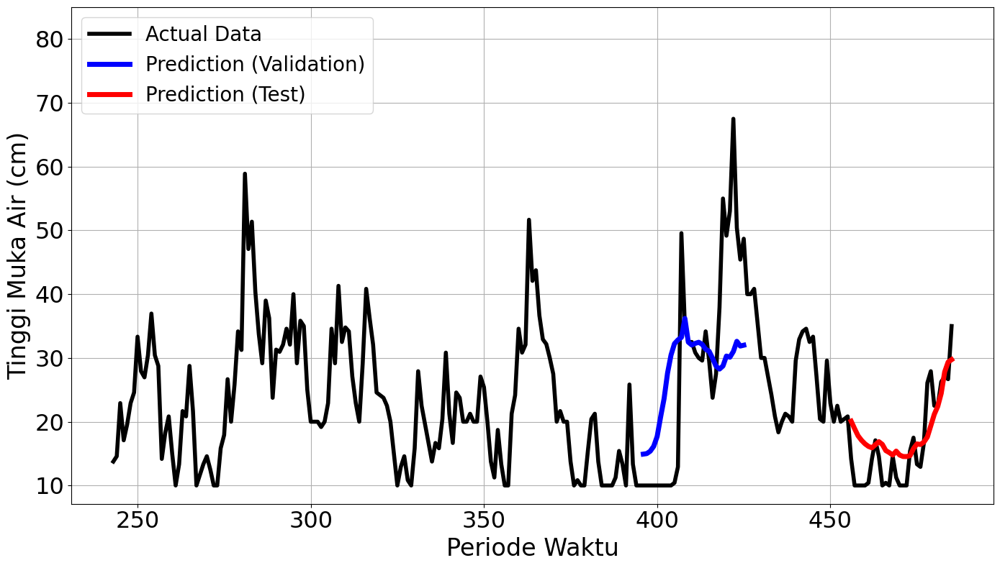

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.2400 - val_loss: 0.0521
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step - loss: 0.1315 - val_loss: 0.0087
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - loss: 0.0501 - val_loss: 0.0546
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0855 - val_loss: 0.0377
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0677 - val_loss: 0.0132
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step - loss: 0.0508 - val_loss: 5.2434e-04
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step - loss: 0.0345 - val_loss: 0.0039
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step - loss: 0.0315 - val_loss: 0.0026
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step - loss: 0.0281 - val_loss: 2.0248e-04
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.0244 - val_loss: 0.0011
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - loss: 0.0208 - val_loss: 0.0032
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - loss: 0.0137 - v

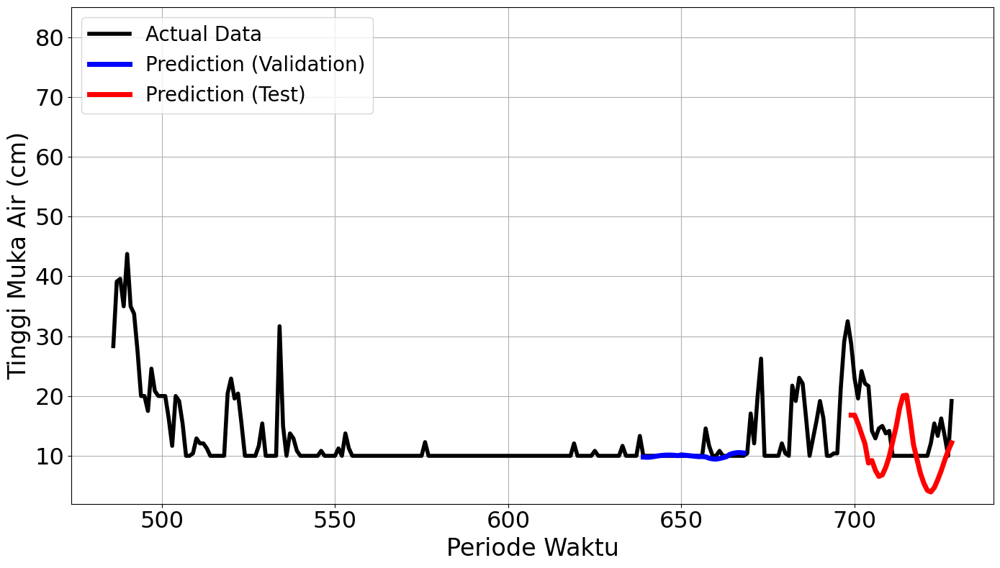

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.1862 - val_loss: 0.2598
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step - loss: 0.2467 - val_loss: 0.1648
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - loss: 0.1789 - val_loss: 0.0237
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0988 - val_loss: 0.0044
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - loss: 0.0960 - val_loss: 0.0040
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.1035 - val_loss: 0.0052
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0716 - val_loss: 0.0094
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step - loss: 0.0796 - val_loss: 0.0110
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.0611 - val_loss: 0.0078
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - loss: 0.0600Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step - loss: 0.0600 - val_loss: 0.0107
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

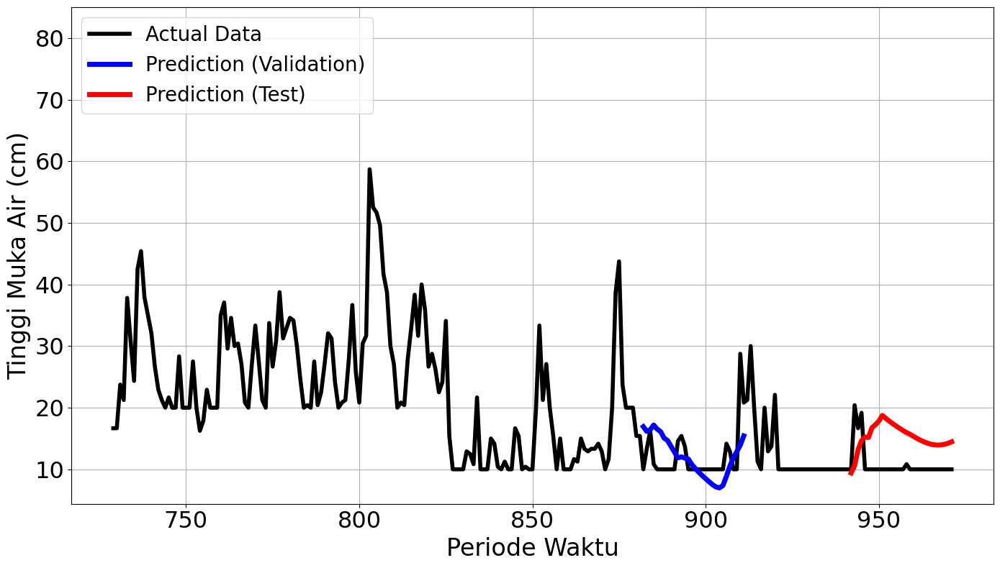

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.2292 - val_loss: 0.0579
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.0871 - val_loss: 0.0370
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step - loss: 0.0669 - val_loss: 0.0287
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0692 - val_loss: 0.0332
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - loss: 0.0359 - val_loss: 0.0303
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - loss: 0.0563 - val_loss: 0.0248
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - loss: 0.0450 - val_loss: 0.0204
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0348 - val_loss: 0.0210
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - loss: 0.0287 - val_loss: 0.0270
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step - loss: 0.0348 - val_loss: 0.0237
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.0297 - val_loss: 0.0174
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step - loss: 0.0186 - val_loss:

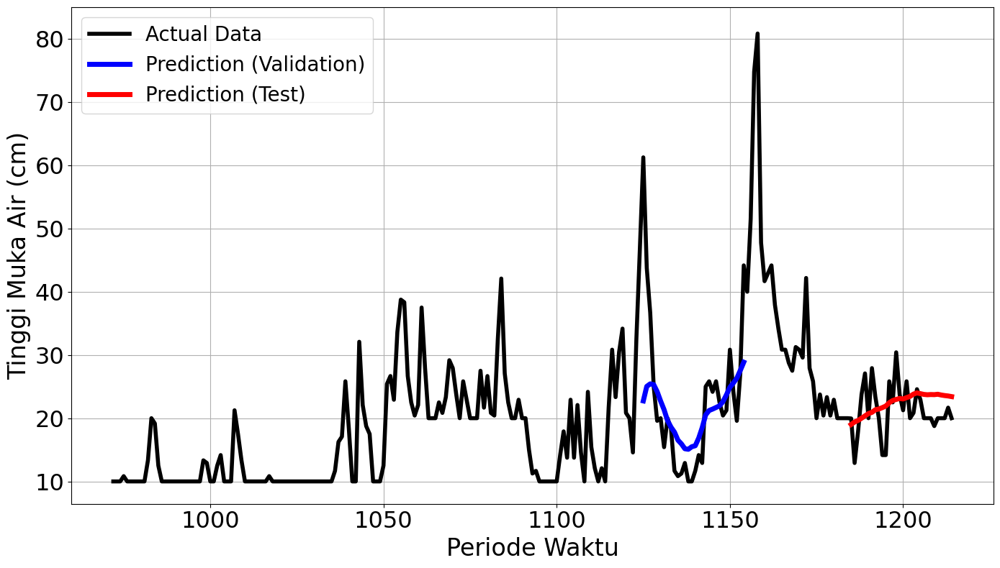

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2776
Final Average MAPE Test: 0.3430
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.2733 - val_loss: 0.2117
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0907 - val_loss: 0.2352
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - loss: 0.0480 - val_loss: 0.1565
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step - loss: 0.0488 - val_loss: 0.0991
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step - loss: 0.0366 - val_loss: 0.0908
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - loss: 0.0279 - val_loss: 0.0919
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - loss: 0.0238 - val_loss: 0.0875
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - loss: 0.0248 - val_loss: 0.0818
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - loss: 0.0242 - val_loss: 0.0643
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step - loss: 0.0183 - val_loss: 0.0454
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - loss: 0.0221 - val_loss: 0.0272
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - loss: 0.0167 - val_loss:

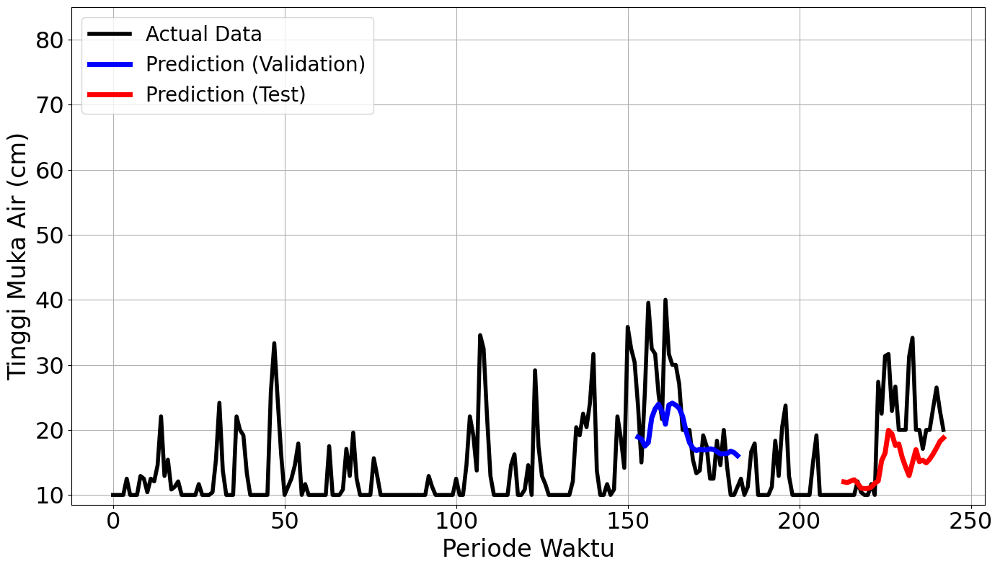

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.1435 - val_loss: 0.2698
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step - loss: 0.2648 - val_loss: 0.1086
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - loss: 0.1213 - val_loss: 0.0453
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.1060 - val_loss: 0.0411
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0902 - val_loss: 0.0450
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step - loss: 0.1061 - val_loss: 0.0499
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - loss: 0.0875 - val_loss: 0.0529
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - loss: 0.0795 - val_loss: 0.0541
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0626Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - loss: 0.0626 - val_loss: 0.0531
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
mape validation = 56.35599641277972 %

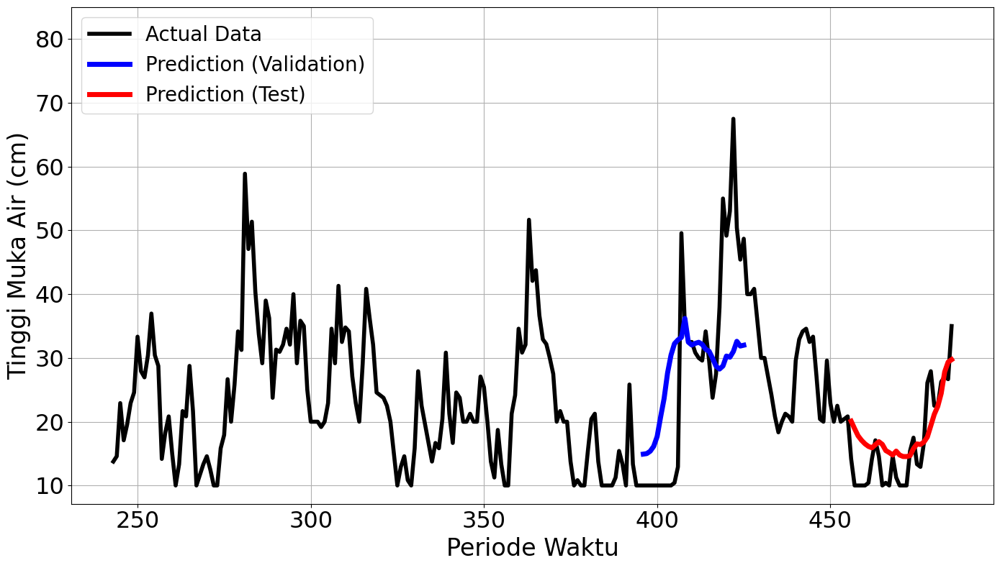

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - loss: 0.2400 - val_loss: 0.0521
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 733ms/step - loss: 0.1315 - val_loss: 0.0087
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0501 - val_loss: 0.0546
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0855 - val_loss: 0.0377
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step - loss: 0.0677 - val_loss: 0.0132
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - loss: 0.0508 - val_loss: 5.2434e-04
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step - loss: 0.0345 - val_loss: 0.0039
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0315 - val_loss: 0.0026
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0281 - val_loss: 2.0248e-04
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step - loss: 0.0244 - val_loss: 0.0011
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0208 - val_loss: 0.0032
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step - loss: 0.0137 - v

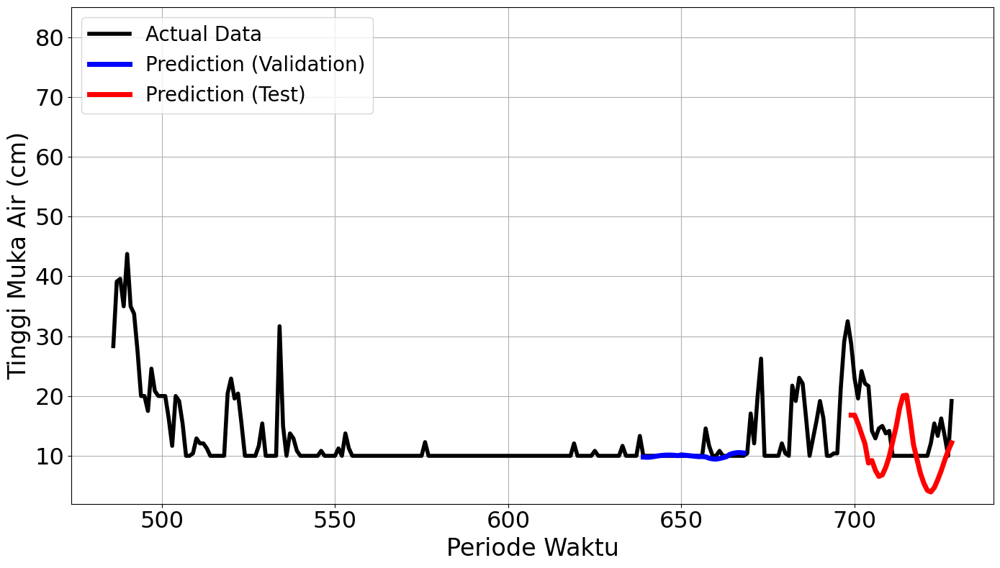

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.1862 - val_loss: 0.2598
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 654ms/step - loss: 0.2467 - val_loss: 0.1648
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step - loss: 0.1789 - val_loss: 0.0237
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0988 - val_loss: 0.0044
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step - loss: 0.0960 - val_loss: 0.0040
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.1035 - val_loss: 0.0052
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - loss: 0.0716 - val_loss: 0.0094
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - loss: 0.0796 - val_loss: 0.0110
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0611 - val_loss: 0.0078
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - loss: 0.0600Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step - loss: 0.0600 - val_loss: 0.0107
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

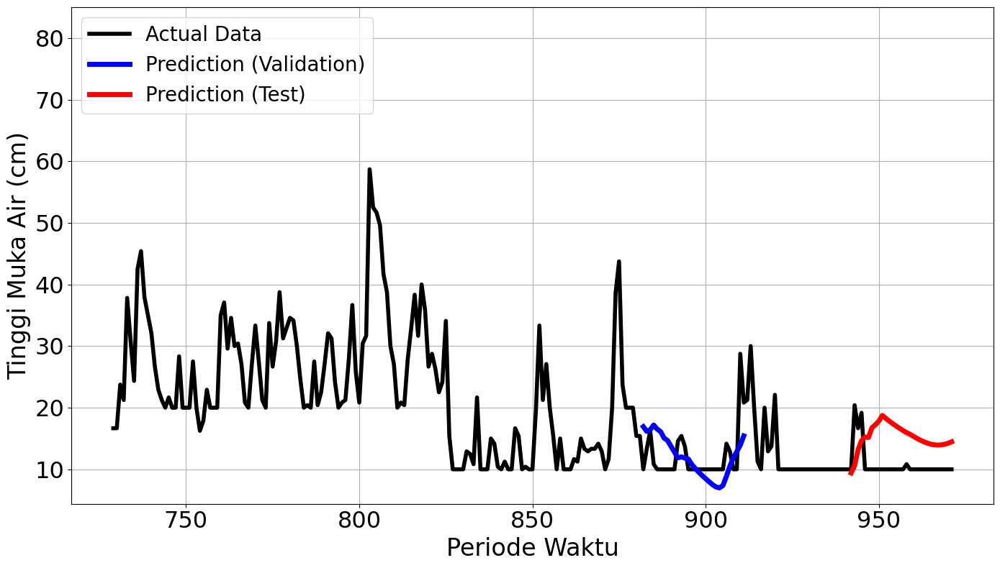

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.2292 - val_loss: 0.0579
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 789ms/step - loss: 0.0871 - val_loss: 0.0370
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0669 - val_loss: 0.0287
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0692 - val_loss: 0.0332
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0359 - val_loss: 0.0303
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0563 - val_loss: 0.0248
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 0.0450 - val_loss: 0.0204
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - loss: 0.0348 - val_loss: 0.0210
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step - loss: 0.0287 - val_loss: 0.0270
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - loss: 0.0348 - val_loss: 0.0237
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - loss: 0.0297 - val_loss: 0.0174
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step - loss: 0.0186 - val_loss:

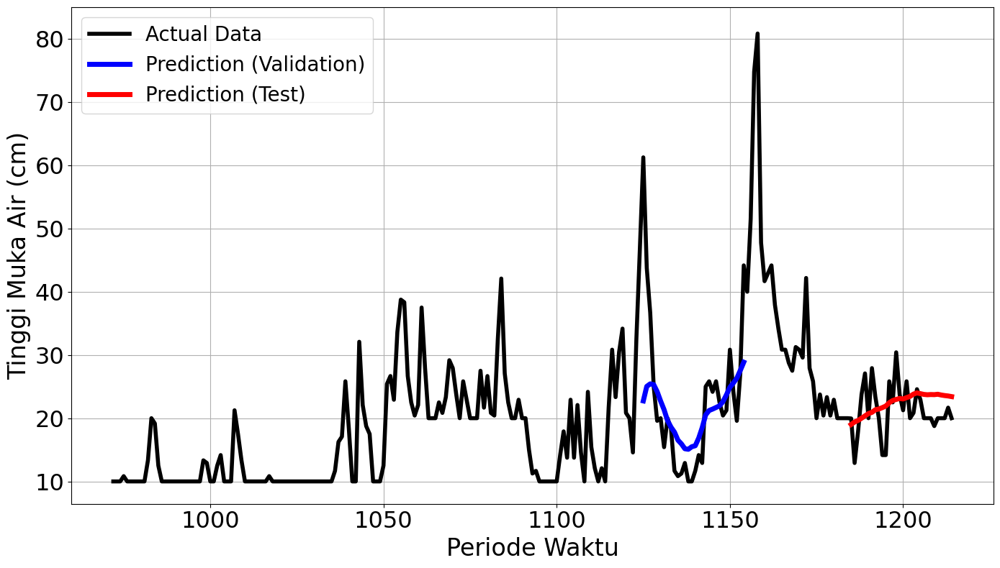

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2776
Final Average MAPE Test: 0.3430


In [10]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.metrics import mean_squared_error
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Parameter Sliding Window Cross Validation
window_size = 243
n_test = 60
n_train_and_val = window_size - n_test
n_train = n_train_and_val - 60
shift = 243
n_windows1 = 5
n_total = len(data_series)
look_back = 30
time_step = 30

import itertools

config_params = {
    "learning_rate" : [0.001, 0.005],
    "batch_size" : [16, 32, 64, 128],
    "neurons" : [50],
    "init_scheme": ['he_uniform', 'glorot_uniform']
}

average_mape_vals_by_param = []
average_mape_tests_by_param = []

for xs in itertools.product(*list(config_params.values())):
  current_param = dict()
  for i, key in enumerate(config_params.keys()):
    if key == "batch_size":
      bsize = xs[i]
    else:
      current_param[key] = xs[i]

  mape_vals = []
  mape_tests = []

  for i in range(n_windows1):
      start = i * shift
      end = start + window_size
      if end > n_total:
          print(f"Window {i+1} tidak dapat dibuat karena melebihi batas data.")
          break

      window_data = data_series[start:end] #sliding window
      train_and_val = window_data[:n_train_and_val]
      train = train_and_val[:n_train]
      val = train_and_val[n_train:]
      test = window_data[n_train_and_val:]

      try:

          train_generator = TimeseriesGenerator(train, train, length=look_back, batch_size=bsize)

          val_generator = TimeseriesGenerator(val, val, length=look_back, batch_size=bsize)

          test_generator = TimeseriesGenerator(test, test, length=look_back, batch_size=bsize)

          model = create_model(current_param['neurons'], current_param['learning_rate'])

          # model.compile(optimizer='adam', loss='mean_squared_error')

          model.fit(train_generator, epochs=150, validation_data=val_generator, callbacks=[EarlyStoppingAtMinLoss(patience=5)], verbose = 1)

          val_predictions = model.predict(val_generator)
          test_predictions  = model.predict(test_generator)

          val_predictions_descale = scaler.inverse_transform(val_predictions).flatten()
          test_predictions_descale = scaler.inverse_transform(test_predictions).flatten()

          train_actual = scaler.inverse_transform(train).flatten()
          val_actual = scaler.inverse_transform(val).flatten()
          test_actual = scaler.inverse_transform(test).flatten()

          all_actual = np.append(np.append(train_actual, val_actual), test_actual)

          val_true = val[look_back:]
          val_true_descale = scaler.inverse_transform(val_true).flatten()
          mape_val = mean_absolute_percentage_error(val_true_descale, val_predictions_descale)

          test_true = test[look_back:]
          test_true_descale = scaler.inverse_transform(test_true).flatten()
          mape_test = mean_absolute_percentage_error(test_true_descale, test_predictions_descale)

          mape_vals.append(mape_val)
          mape_tests.append(mape_test)

          print(f"mape validation = {mape_val * 100} %")
          print(f"mape test = {mape_test * 100} %")

          # X_actual = np.arange(0, len(train) + len(val) + len(test))
          # X_train = np.arange(0, len(train))
          # X_val = np.arange(len(train) + look_back, len(train) + len(val))
          # X_test = np.arange(len(train) + len(val) + look_back, len(train) + len(val) + len(test))
          start_idx = start
          X_actual = np.arange(start_idx, start_idx + len(train) + len(val) + len(test))
          X_val = np.arange(start_idx + len(train) + look_back, start_idx + len(train) + len(val))
          X_test = np.arange(start_idx + len(train) + len(val) + look_back, start_idx + len(train) + len(val) + len(test))
          # axs[i].plot(X_actual, all_actual, lw=2, color='black', label='actual data')
          # axs[i].plot(X_val, val_predictions_descale, lw=2.5, color='blue', label='prediction validation')
          # axs[i].plot(X_test, test_predictions_descale, lw=2.5, color='red', label='prediction test')
          # axs[i].set_title(f'Window {i+1}')
          # axs[i].legend(loc='upper left')  # legend untuk setiap subplot
          plt.figure(figsize=(14, 8))
          plt.plot(X_actual, all_actual, lw=4, color='black', label='Actual Data')
          plt.plot(X_val, val_predictions_descale, lw=5, color='blue', label='Prediction (Validation)')
          plt.plot(X_test, test_predictions_descale, lw=5, color='red', label='Prediction (Test)')
          # plt.title(f'Window {i+1}', fontsize=25)
          plt.xlabel('Periode Waktu', fontsize=24)
          plt.ylabel('Tinggi Muka Air (cm)', fontsize=24)
          plt.ylim(top=85)
          plt.tick_params(axis='both', labelsize=23)
          # plt.setp(ax.get_xticklabels(), rotation=0, ha='center')
          plt.legend(loc='upper left', fontsize=20)
          plt.grid(True)
          plt.tight_layout()
          plt.show()

      except Exception as e:
          print(f"Error pada Window {i+1}: {e}")
          continue

  # Setelah loop selesai semua
  plt.tight_layout(rect=[0, 0, 1, 0.97])
  plt.show()

  # Rata-rata MAPE akhir
  if mape_vals and mape_tests:
      final_mape_val = np.mean(mape_vals)
      final_mape_test = np.mean(mape_tests)
      print(f"\nFinal Average MAPE Validation: {final_mape_val:.4f}")
      print(f"Final Average MAPE Test: {final_mape_test:.4f}")
      average_mape_vals_by_param.append(final_mape_val)
      average_mape_tests_by_param.append(final_mape_test)

### Hyperparameter Summary (SWCV)

In [11]:
hyperparameter_summary = pd.DataFrame({
    "mape_vals" : average_mape_vals_by_param,
    "mape_tests" : average_mape_tests_by_param
})


hyperparameter_summary.sort_values("mape_tests")

,mape_vals,mape_tests
15,0.277639,0.343031
14,0.277639,0.343031
9,0.291065,0.362256
8,0.291065,0.362256
10,0.298575,0.375693
11,0.298575,0.375693
0,0.311633,0.413230
1,0.311633,0.413230
13,0.297888,0.455112
12,0.297888,0.455112


In [12]:
best_idx = int(hyperparameter_summary.sort_values("mape_tests").index[0])
best_idx

15

In [13]:
parameter_combinations = list(itertools.product(*list(config_params.values())))
best_parameter = parameter_combinations[best_idx]
best_param = dict()
for i, key in enumerate(config_params.keys()):
  best_param[key] = best_parameter[i]
best_param

{'learning_rate': 0.005,
 'batch_size': 128,
 'neurons': 50,
 'init_scheme': 'glorot_uniform'}

### Best Parameter (SWCV)

In [14]:
best_param = {'learning_rate': 0.005, 'batch_size': 128, 'neurons': 50, 'init_scheme': 'glorot_uniform'}

In [15]:
def create_model(neurons, learning_rate, init_scheme='glorot_uniform'):
    seed = 42
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

    model = Sequential()
    model.add(LSTM(
        neurons,
        activation='tanh',
        kernel_initializer=init_scheme,
        input_shape=(time_step, 1)
    ))
    model.add(Dropout(0.2))
    model.add(Dense(1))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

In [16]:
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import numpy as np

data = pd.read_csv('https://raw.githubusercontent.com/Mluthfialgifari/Tugas-Akhir-Skripsi/refs/heads/main/Data/Data%20TMA%20(Jan%202022%20-%20Mei%202025).csv')
data = data.loc[:, ['Daily_Period', 'TMA_Daily']]
data = data.iloc[972:1215].reset_index(drop=True)

train_data = data.iloc[:123]
val_data = data.iloc[123:183]
test_data = data.iloc[183:]

# Mengambil kolom 'TMA_Daily' sebagai data yang akan diprediksi
time_series_data = data['TMA_Daily'].values.reshape(-1, 1)

# Normalisasi data ke rentang 0-1
scaler = MinMaxScaler()
time_series_data = scaler.fit_transform(time_series_data)

# Menentukan ukuran dataset
train_size = 123
val_size = 60
test_size = len(time_series_data) - train_size - val_size

# Membagi data menjadi train, val, test
train_data = time_series_data[:train_size]
val_data = time_series_data[train_size:train_size+val_size]
test_data = time_series_data[train_size+val_size:]

# Fungsi untuk membuat dataset dengan sekuens deret waktu
def create_sequences(data, seq_length):
    sequences = []
    for i in range(len(data) - seq_length):
        sequences.append(data[i : i + seq_length])
    return np.array(sequences)

# Panjang sekuens deret waktu
seq_length = 30

# Membuat dataset sekuens
X_train = create_sequences(train_data, seq_length)
X_val = create_sequences(val_data, seq_length)
X_test = create_sequences(test_data, seq_length)

# Memisahkan fitur dan target
y_train = X_train[:, -1]
X_train = X_train[:, :-1]

y_val = X_val[:, -1]
X_val = X_val[:, :-1]

y_test = X_test[:, -1]
X_test = X_test[:, :-1]

# Reshape untuk input LSTM (samples, time steps, features)
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

model = create_model(best_param['neurons'],
                     best_param['learning_rate'],
                     best_param.get('init_scheme', 'glorot_uniform')
)
history = model.fit(
    X_train, y_train,
    epochs=150,
    batch_size=128,
    validation_data=(X_val, y_val),
    verbose=10)

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/150
Epoch 74/150
Epoch 75/150
Epoch 76/150
Epoch 77/150
Epoch 78/150
Epoch 7

### Plot Model Loss

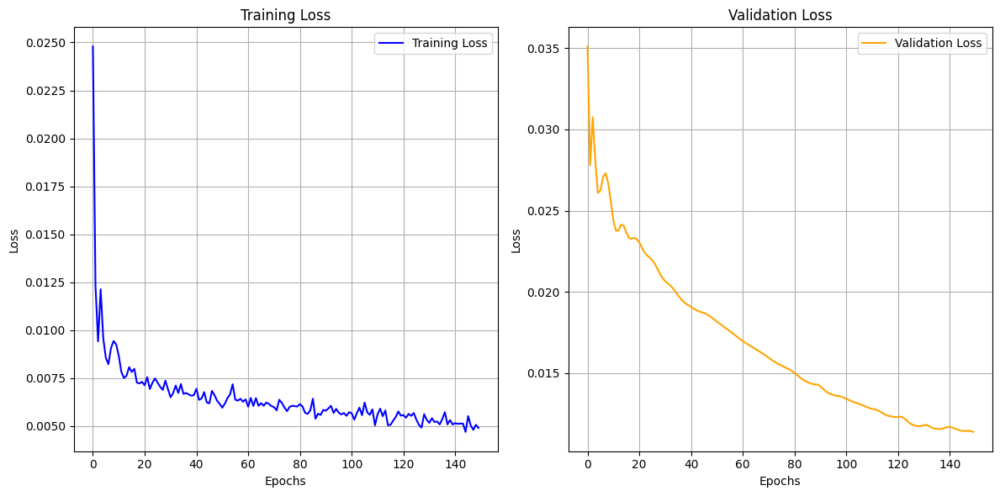

In [17]:
import matplotlib.pyplot as plt

# Membuat subplot 1 baris 2 kolom
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Subplot kiri: Training Loss
axs[0].plot(history.history['loss'], label='Training Loss', color='blue')
axs[0].set_title('Training Loss')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss')
axs[0].grid(True)
axs[0].legend()

# Subplot kanan: Validation Loss
axs[1].plot(history.history['val_loss'], label='Validation Loss', color='orange')
axs[1].set_title('Validation Loss')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss')
axs[1].grid(True)
axs[1].legend()

# Tata letak rapat
plt.tight_layout()
plt.show()

### MAPE Train

In [18]:
def inverse_transform(scaler, input):
  return input * (scaler.data_max_[0] - scaler.data_min_[0]) + scaler.data_min_[0]

# inverse_transform(scaler, predicted)

In [19]:
train_predict = model.predict(X_train).flatten()
train_predict_denorm = inverse_transform(scaler, train_predict)
y_train_denorm = inverse_transform(scaler, y_train)
mape_train = mean_absolute_percentage_error(y_train_denorm, train_predict_denorm)
mape_train

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


0.18634558585552993

### Plot Train Actual vs Predicted

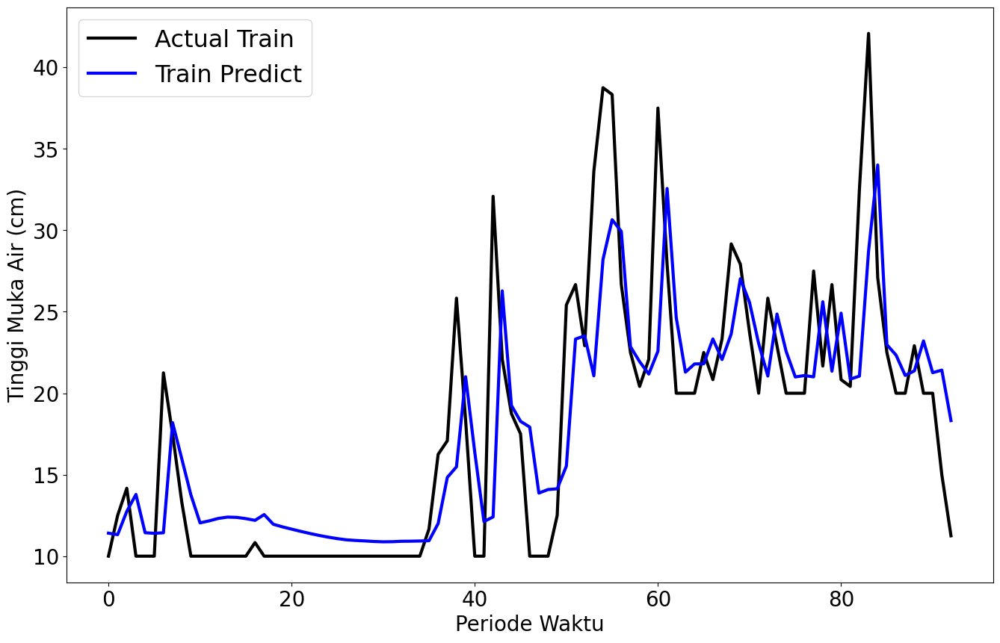

In [20]:
# Plot perbandingan actual train dan train predict

plt.figure(figsize=(16, 10))

plt.plot(y_train_denorm, lw=3, label='Actual Train', color = 'black')
plt.plot(train_predict_denorm, lw=3, label='Train Predict', color = 'blue')
# plt.title('Perbandingan Actual Train dan Train Predict')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Periode Waktu', fontsize=20)
plt.ylabel('Tinggi Muka Air (cm)', fontsize=20)
plt.legend(loc = 'upper left', fontsize = 23)
plt.show()